Data Mining Final Project CS6220

Authors: Jacqueline Girouard, Aisha Kothare, and Joanna Ng

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
from scipy import stats
warnings.filterwarnings('ignore')

# **Part** 1: Load Data
*Author*: *Jacqueline Girouard*

In [ ]:
#load data from colab files
#orginally downloaded from
#https://www.kaggle.com/datasets/osmi/mental-health-in-tech-survey?resource=download
from google.colab import files
uploaded = files.upload()

Saving survey.csv to survey (2).csv


In [ ]:
import io
df = pd.read_csv(io.BytesIO(uploaded['survey.csv']))
#drop comments, not used in models
df = df.drop(columns=['Timestamp', 'comments'], axis=1)

## ***Part 2.1***: Preprocess Data

Authors: *Aisha Kothare and Jacqueline Girouard*

## checking null/nan values
*Author*: *aisha Kothare*

In [ ]:
df.isnull().sum()

Age                            0
Gender                         0
Country                        0
state                        515
self_employed                 18
family_history                 0
treatment                      0
work_interfere               264
no_employees                   0
remote_work                    0
tech_company                   0
benefits                       0
care_options                   0
wellness_program               0
seek_help                      0
anonymity                      0
leave                          0
mental_health_consequence      0
phys_health_consequence        0
coworkers                      0
supervisor                     0
mental_health_interview        0
phys_health_interview          0
mental_vs_physical             0
obs_consequence                0
dtype: int64

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1259 entries, 0 to 1258
Data columns (total 25 columns):
 #   Column                     Non-Null Count  Dtype 
---  ------                     --------------  ----- 
 0   Age                        1259 non-null   int64 
 1   Gender                     1259 non-null   object
 2   Country                    1259 non-null   object
 3   state                      744 non-null    object
 4   self_employed              1241 non-null   object
 5   family_history             1259 non-null   object
 6   treatment                  1259 non-null   object
 7   work_interfere             995 non-null    object
 8   no_employees               1259 non-null   object
 9   remote_work                1259 non-null   object
 10  tech_company               1259 non-null   object
 11  benefits                   1259 non-null   object
 12  care_options               1259 non-null   object
 13  wellness_program           1259 non-null   object
 14  seek_hel

### checking unique values for columns with Nan or null values
Author: aisha Kothare

In [ ]:
for column in df:
  print(column,": ",df[column].unique())

Age :  [         37          44          32          31          33          35
          39          42          23          29          36          27
          46          41          34          30          40          38
          50          24          18          28          26          22
          19          25          45          21         -29          43
          56          60          54         329          55 99999999999
          48          20          57          58          47          62
          51          65          49       -1726           5          53
          61           8          11          -1          72]
Gender :  ['Female' 'M' 'Male' 'male' 'female' 'm' 'Male-ish' 'maile' 'Trans-female'
 'Cis Female' 'F' 'something kinda male?' 'Cis Male' 'Woman' 'f' 'Mal'
 'Male (CIS)' 'queer/she/they' 'non-binary' 'Femake' 'woman' 'Make' 'Nah'
 'All' 'Enby' 'fluid' 'Genderqueer' 'Female ' 'Androgyne' 'Agender'
 'cis-female/femme' 'Guy (-ish) ^_^' 'male leanin

### replacing nan work interference values with undisclosed

In [ ]:
df['work_interfere'] = df['work_interfere'].replace(np.nan, 'undisclosed')

### replacing nan self employed values with undisclosed

In [ ]:
df['self_employed'] = df['self_employed'].replace(np.nan, 'undisclosed')

### replacing nan state values with not specified

In [ ]:
df['state'] = df['state'].replace(np.nan, 'not specified')

### replace gender categories uniformly
Author: Jacqueline Girouard

In [ ]:
df.Gender.unique()

array(['Female', 'M', 'Male', 'male', 'female', 'm', 'Male-ish', 'maile',
       'Trans-female', 'Cis Female', 'F', 'something kinda male?',
       'Cis Male', 'Woman', 'f', 'Mal', 'Male (CIS)', 'queer/she/they',
       'non-binary', 'Femake', 'woman', 'Make', 'Nah', 'All', 'Enby',
       'fluid', 'Genderqueer', 'Female ', 'Androgyne', 'Agender',
       'cis-female/femme', 'Guy (-ish) ^_^', 'male leaning androgynous',
       'Male ', 'Man', 'Trans woman', 'msle', 'Neuter', 'Female (trans)',
       'queer', 'Female (cis)', 'Mail', 'cis male', 'A little about you',
       'Malr', 'p', 'femail', 'Cis Man',
       'ostensibly male, unsure what that really means'], dtype=object)

In [ ]:
def gender_bins(df):
  """
  Combine synonomous gender tags (eg M and Male) where doing so does not change
  the gender identity of the respondant
  Author: Jacqueline and Joanna

  Input
  -----
  df: dataframe
    orginal df for preprocessing

  Returns
  -------
  df: dataframe
    preprocess dataframe


  """
  generic_female_tags = ["cis female", "f", "female", "woman",  "femake", "female ","cis-female/femme", "female (cis)", "femail",'Female',"F","Woman"]
  generic_male_tags = ["Male", "M","male", "male-ish", "maile", "mal", "male (cis)", "make", "male ", "man","msle", "mail", "malr","cis man", "Cis Male", "cis male","Man"]

  for (_, col) in df.iterrows():
    if str.lower(col.Gender) in generic_male_tags:
        df['Gender'].replace(to_replace=col.Gender, value='Male', inplace=True)

    elif str.lower(col.Gender) in generic_female_tags:
        df['Gender'].replace(to_replace=col.Gender, value='Female', inplace=True)

    else:
        df['Gender'].replace(to_replace=col.Gender, value='Non_Binary', inplace=True)
  return df

# df = gender_synonyms(df)
# df_cat = df.copy()


### replace bad age values
Author: Jacqueline Girouard

In [ ]:
df = gender_bins(df)
df_cat = df.copy()

In [ ]:
def remove_bad_values(df):
  """
  Clean bad values and remove data from df
  Author: Jacqueline Girouard

  Input
  -----
  df: dataframe
    orginal df for preprocessing

  Returns
  -------
  df: datafram
    preprocess dataframe
  """

  #remove data with faulty age
  df = df[df.Age >= 0]
  df = df[df.Age <= 100]
  return df

# df = remove_bad_values(df)

In [ ]:
df = remove_bad_values(df)

###translate categoric values to numeric

Author: Jacqueline Girouard

In [ ]:
#translate quantitative values into to numeric categories
def transform_to_numeric(df, columnsToTransform):
  """
  Reassign the target values from categories into numeric values
  Author: Jacqueline Girouard

  Input
  -----
  df: dataframe
    orginal df for preprocessing

  columnsToTransform: list(str)
    column names in datafram to transform

  Returns
  -------
  df: dataframe
    preprocess dataframe

  value_to_cat: dictionary
    value to cat dictionary to translate back to categories later

  """
  value_to_cat = {}
  for (columnName, columnData) in df.iteritems():
    if columnName in columnsToTransform:
      col_dict = {}
      # counting unique categorical values
      unqiue_cats = df[columnName].unique()
      unique_tag = np.arange(len(unqiue_cats))
      #replace categorical name with numeric int tag
      df[columnName].replace(unqiue_cats, unique_tag, inplace=True)
      for index in range(len(unique_tag)):
        col_dict[unique_tag[index]] = unqiue_cats[index]

      value_to_cat[columnName] =  col_dict
  df.apply(pd.to_numeric)
  return df, value_to_cat

#clean data
# keys = list(df.columns)
# keys.remove("Age")
# df, value_to_cat = transform_to_numeric(df, keys)
# display(df)

In [ ]:
keys = list(df.columns)
keys.remove("Age")
df, value_to_cat = transform_to_numeric(df, keys)
display(df)

,Age,Gender,Country,state,self_employed,family_history,treatment,work_interfere,no_employees,remote_work,...,anonymity,leave,mental_health_consequence,phys_health_consequence,coworkers,supervisor,mental_health_interview,phys_health_interview,mental_vs_physical,obs_consequence
0,37,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,44,1,0,1,0,0,1,1,1,0,...,1,1,1,0,1,1,0,1,1,0
2,32,2,1,2,0,0,1,1,0,0,...,1,2,0,0,2,0,1,2,2,0
3,31,2,2,2,0,1,0,0,2,0,...,2,2,2,1,0,1,2,0,2,1
4,31,2,0,3,0,0,1,2,3,1,...,1,1,0,0,0,0,1,2,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1254,26,2,2,2,2,0,0,4,2,0,...,1,0,0,0,0,2,0,1,1,0
1255,32,2,0,0,2,1,0,0,2,1,...,0,2,0,0,0,0,0,1,0,0
1256,34,2,0,7,2,1,0,3,1,0,...,1,2,2,1,1,1,0,1,2,0
1257,46,0,0,11,2,0,1,4,3,1,...,1,1,2,0,1,1,0,1,2,0


### **Part** 2.2 Investigate Data

#### 2.2.1 using heat map to gauge feature correlation
*Author: Aisha Kothare*

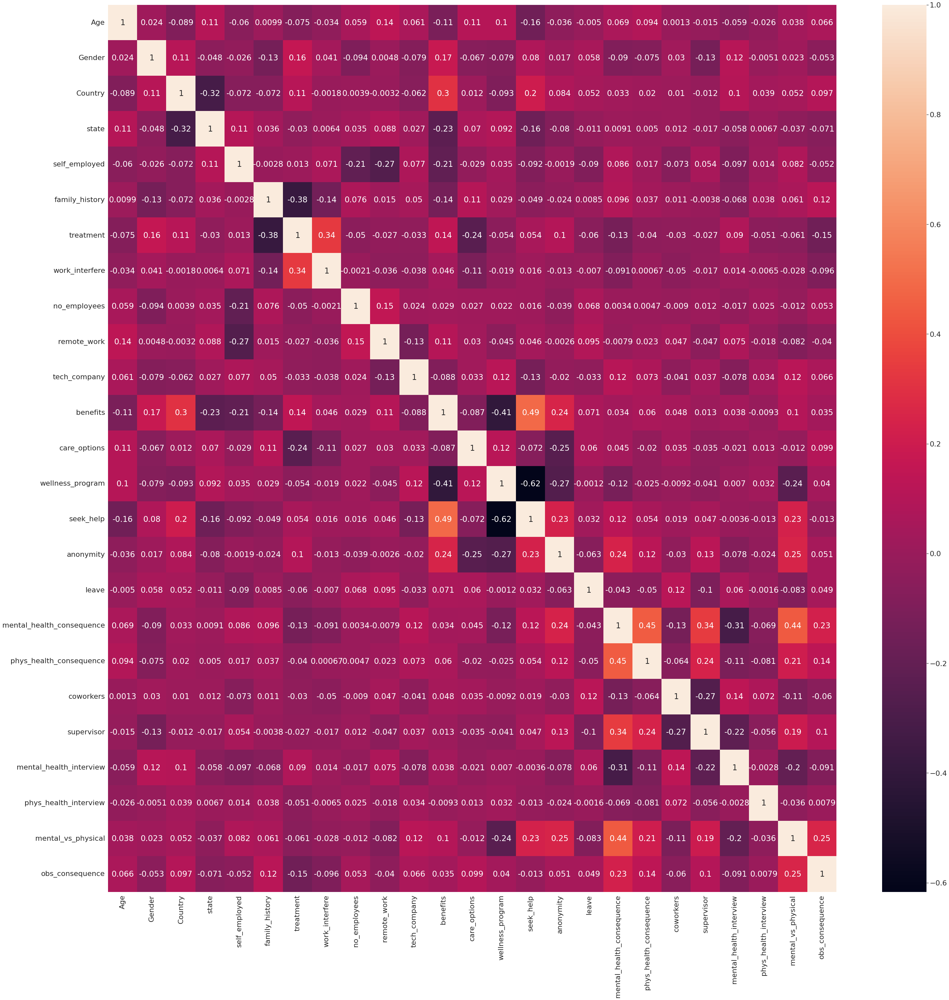

In [ ]:
"""
Heat map to showcase general correlation between features - technique one for feature importance
Author: Aisha Kothare
"""
import seaborn as sns
import matplotlib.pyplot as plt

fig, ax = plt.subplots(figsize=(50, 50))
sns.set(font_scale=2)
sns.heatmap(df.corr(), ax=ax, annot=True)


### **Part** 2.2.2 using univariate feature selection to get a closer look into feature scores
*Author: Aisha Kothare*

In [ ]:
"""
Univariate feature selection - for target predictions wrt treatment
Author: Aisha Kothare

A function to get the dataframe split into target and features based on the
column name given as argument. this is the target column.
"""
def feature_selection(target_feature):

  from sklearn.feature_selection import SelectKBest
  from sklearn.feature_selection import chi2
  y = df[target_feature]
  X = df.loc[:, df.columns != target_feature]
  return y,X


In [ ]:
"""
Get feature scores for target
Author: Aisha Kothare

A function that takes the dataframes containing target y and features X and
return feature scores wrt y.
"""
def get_feature_scores(X,y):
  from sklearn.feature_selection import SelectKBest
  from sklearn.feature_selection import chi2
  bestfeatures = SelectKBest(score_func=chi2, k=10)
  fit = bestfeatures.fit(X,y)
  X = pd.DataFrame(X)
  y = pd.DataFrame(y)
  dfscores = pd.DataFrame(fit.scores_)
  dfcolumns = pd.DataFrame(X.columns)
  featureScores = pd.concat([dfcolumns,dfscores],axis=1)
  featureScores.columns = ['Specs','Score']
  return featureScores

In [ ]:
"""
Univariate feature selection - for target predictions wrt treatment
Author: Aisha Kothare
"""
y_treatment , X_treatment = feature_selection('treatment')


In [ ]:
featureScores_treatment = get_feature_scores(X_treatment,y_treatment)

In [ ]:
featureScores_treatment

,Specs,Score
0,Age,12.057698
1,Gender,14.341049
2,Country,265.503527
3,state,11.033460
4,self_employed,0.016929
5,family_history,109.203431
6,work_interfere,93.759412
7,no_employees,3.700461
8,remote_work,0.638407
9,tech_company,1.109928


In [ ]:
"""
Univariate feature selection - for target predictions wrt mental_health_consequence
Author: Aisha Kothare
"""
y_mental_health,X_mental_health = feature_selection('mental_health_consequence')

In [ ]:
featureScores_mental_health_consequence = get_feature_scores(X_mental_health,y_mental_health)
featureScores_mental_health_consequence

,Specs,Score
0,Age,10.056614
1,Gender,5.217002
2,Country,141.526955
3,state,17.297393
4,self_employed,1.024335
5,family_history,7.043900
6,treatment,10.595465
7,work_interfere,7.268012
8,no_employees,0.024059
9,remote_work,3.525192


In [ ]:
"""
Univariate feature selection - for target predictions wrt tech_industry
Author: Aisha Kothare
"""
y_tech_industry,X_tech_industry = feature_selection('tech_company')

In [ ]:
featureScores_tech_industry = get_feature_scores(X_tech_industry,y_tech_industry)
featureScores_tech_industry

,Specs,Score
0,Age,7.914118
1,Gender,3.415367
2,Country,76.778030
3,state,9.088113
4,self_employed,0.606257
5,family_history,1.887862
6,treatment,0.683448
7,work_interfere,1.219959
8,no_employees,0.839441
9,remote_work,15.496826


### All features ranked in descending feature scores

In [ ]:
print(featureScores_treatment.nlargest(23,'Score'))

                        Specs       Score
2                     Country  265.503527
5              family_history  109.203431
6              work_interfere   93.759412
11               care_options   39.580222
23            obs_consequence   25.602375
10                   benefits   18.258563
20    mental_health_interview   15.609375
16  mental_health_consequence   14.569312
1                      Gender   14.341049
0                         Age   12.057698
3                       state   11.033460
15                      leave    5.372040
14                  anonymity    4.760488
12           wellness_program    4.343778
7                no_employees    3.700461
17    phys_health_consequence    2.807377
22         mental_vs_physical    2.512461
21      phys_health_interview    2.394762
13                  seek_help    1.689493
18                  coworkers    1.211460
9                tech_company    1.109928
19                 supervisor    0.697376
8                 remote_work    0

In [ ]:
print(featureScores_treatment.nlargest(5,'Score'))

              Specs       Score
2           Country  265.503527
5    family_history  109.203431
6    work_interfere   93.759412
11     care_options   39.580222
23  obs_consequence   25.602375


In [ ]:
print(featureScores_mental_health_consequence.nlargest(23,'Score'))

                      Specs       Score
17  phys_health_consequence  372.830428
20  mental_health_interview  202.389851
2                   Country  141.526955
19               supervisor  141.041641
22       mental_vs_physical  131.593515
23          obs_consequence   57.649767
18                coworkers   54.472640
16                    leave   37.008493
15                anonymity   26.779312
13         wellness_program   22.883416
3                     state   17.297393
10             tech_company   16.043895
6                 treatment   10.595465
0                       Age   10.056614
14                seek_help    8.821927
7            work_interfere    7.268012
5            family_history    7.043900
11                 benefits    6.800274
1                    Gender    5.217002
21    phys_health_interview    4.555499
9               remote_work    3.525192
12             care_options    1.636380
4             self_employed    1.024335


In [ ]:
print(featureScores_mental_health_consequence.nlargest(5,'Score'))

                      Specs       Score
17  phys_health_consequence  372.830428
20  mental_health_interview  202.389851
2                   Country  141.526955
19               supervisor  141.041641
22       mental_vs_physical  131.593515


In [ ]:
print(featureScores_tech_industry.nlargest(23,'Score'))

                        Specs      Score
2                     Country  76.778030
12           wellness_program  20.487229
9                 remote_work  15.496826
16  mental_health_consequence  11.898478
20    mental_health_interview  11.788721
22         mental_vs_physical   9.882439
13                  seek_help   9.531346
17    phys_health_consequence   9.386044
3                       state   9.088113
0                         Age   7.914118
10                   benefits   7.040857
23            obs_consequence   4.664539
1                      Gender   3.415367
18                  coworkers   2.225995
5              family_history   1.887862
15                      leave   1.611118
19                 supervisor   1.315794
7              work_interfere   1.219959
21      phys_health_interview   1.080424
8                no_employees   0.839441
11               care_options   0.718962
6                   treatment   0.683448
4               self_employed   0.606257


In [ ]:
print(featureScores_tech_industry.nlargest(5,'Score'))

                        Specs      Score
2                     Country  76.778030
12           wellness_program  20.487229
9                 remote_work  15.496826
16  mental_health_consequence  11.898478
20    mental_health_interview  11.788721


In [ ]:
def summary_statistics(df):
  """
  Investigate signicant class inbalance potential and print visual
  Author: Jacqueline Girouard

  Input
  -----
  df: dataframe

  """
  #### minimum value, maximum value, mean, standard deviation, count, and 25:50:75% percentiles
  summary = df.describe(percentiles=[.25, .5, .75])
  ### calculate and append variance
  summary =summary.append(pd.Series(df.var(), name='var'))
  ### calculate and append range
  max_series = pd.Series(df.max(), name='max')
  min_series = pd.Series(df.min(), name='min')
  range_series = max_series.subtract(min_series)
  summary.append(pd.Series(range_series, name='range'))
  return summary

summary = summary_statistics(df)
display(summary)

,Age,Gender,Country,state,self_employed,family_history,treatment,work_interfere,no_employees,remote_work,...,anonymity,leave,mental_health_consequence,phys_health_consequence,coworkers,supervisor,mental_health_interview,phys_health_interview,mental_vs_physical,obs_consequence
count,1254.000000,1254.000000,1254.000000,1254.000000,1254.000000,1254.000000,1254.000000,1254.000000,1254.000000,1254.000000,...,1254.000000,1254.000000,1254.000000,1254.000000,1254.000000,1254.000000,1254.000000,1254.000000,1254.000000,1254.000000
mean,32.019139,1.471292,3.392344,8.162679,1.856459,0.390750,0.495215,2.426635,1.854067,0.297448,...,0.752791,1.532695,0.840510,0.482456,0.562998,0.869219,0.363636,0.716906,0.996810,0.145136
std,7.375005,0.802265,7.377787,8.858145,0.389571,0.488113,0.500177,1.271189,1.485845,0.457318,...,0.537029,1.345430,0.771656,0.828037,0.777026,0.820017,0.749664,0.723840,0.736673,0.352378
min,5.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,27.000000,1.000000,0.000000,2.000000,2.000000,0.000000,0.000000,1.250000,1.000000,0.000000,...,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,31.000000,2.000000,0.000000,4.000000,2.000000,0.000000,0.000000,3.000000,2.000000,0.000000,...,1.000000,1.000000,1.000000,0.000000,0.000000,1.000000,0.000000,1.000000,1.000000,0.000000
75%,36.000000,2.000000,2.000000,12.000000,2.000000,1.000000,1.000000,3.000000,3.000000,1.000000,...,1.000000,2.000000,1.000000,1.000000,1.000000,2.000000,0.000000,1.000000,2.000000,0.000000
max,72.000000,2.000000,46.000000,45.000000,2.000000,1.000000,1.000000,4.000000,5.000000,1.000000,...,2.000000,4.000000,2.000000,2.000000,2.000000,2.000000,2.000000,2.000000,2.000000,1.000000
var,54.390695,0.643628,54.431737,78.466731,0.151766,0.238254,0.250177,1.615922,2.207737,0.209140,...,0.288400,1.810183,0.595453,0.685646,0.603769,0.672428,0.561997,0.523944,0.542687,0.124170


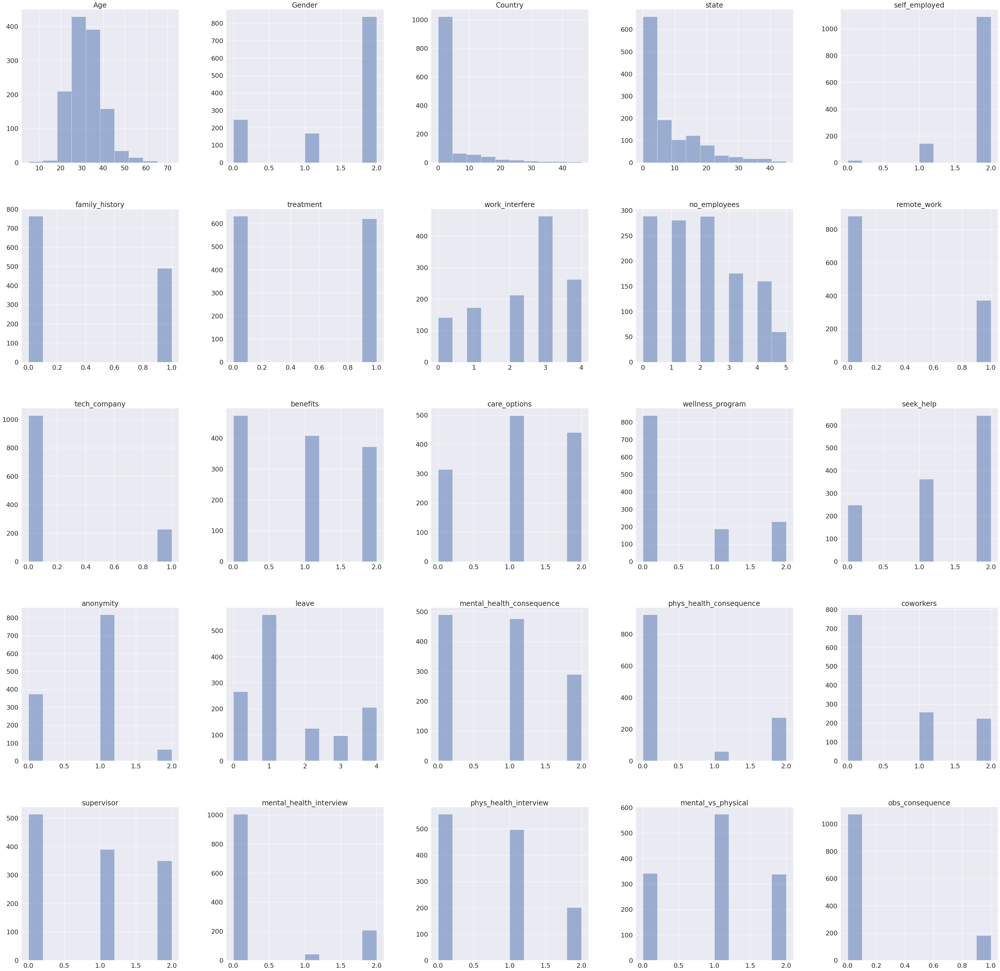

In [ ]:
def get_histogram(df):
  """
  Display histogram of dataframe feature class distributions
  Author: Jacqueline Girouard

  Input
  -----
  df: dataframe

  """
  df.hist(alpha=0.5, figsize=(60, 60))

get_histogram(df)

In [ ]:
def get_histogram_hue(df, y_col):
  """
  Display histogram of dataframe feature class distributions
  Author: Jacqueline Girouard

  Input
  -----
  df: dataframe

  y_col:
      Target feature for predictive model

  """
  plot_max = len(list(df.columns))+1
  plot_count = 1
  fig = plt.figure(figsize=(60, 60))
  for (columnName, columnData) in df.iteritems():
    ax = fig.add_subplot(int(plot_max/5), 5, plot_count)
    sns.histplot(data=df, x=columnName, hue=y_col, multiple="stack")
    ax.set_title("{}".format(columnName))

    plot_count += 1



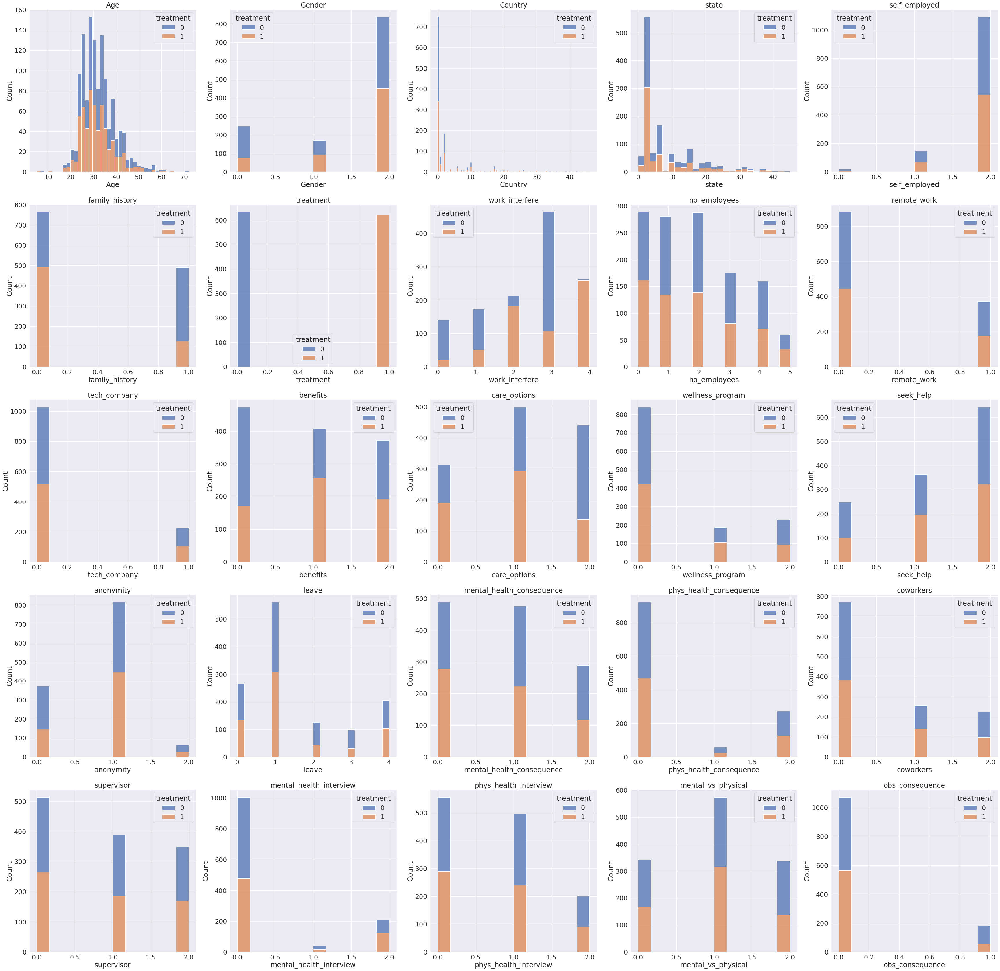

In [ ]:
get_histogram_hue(df, 'treatment')

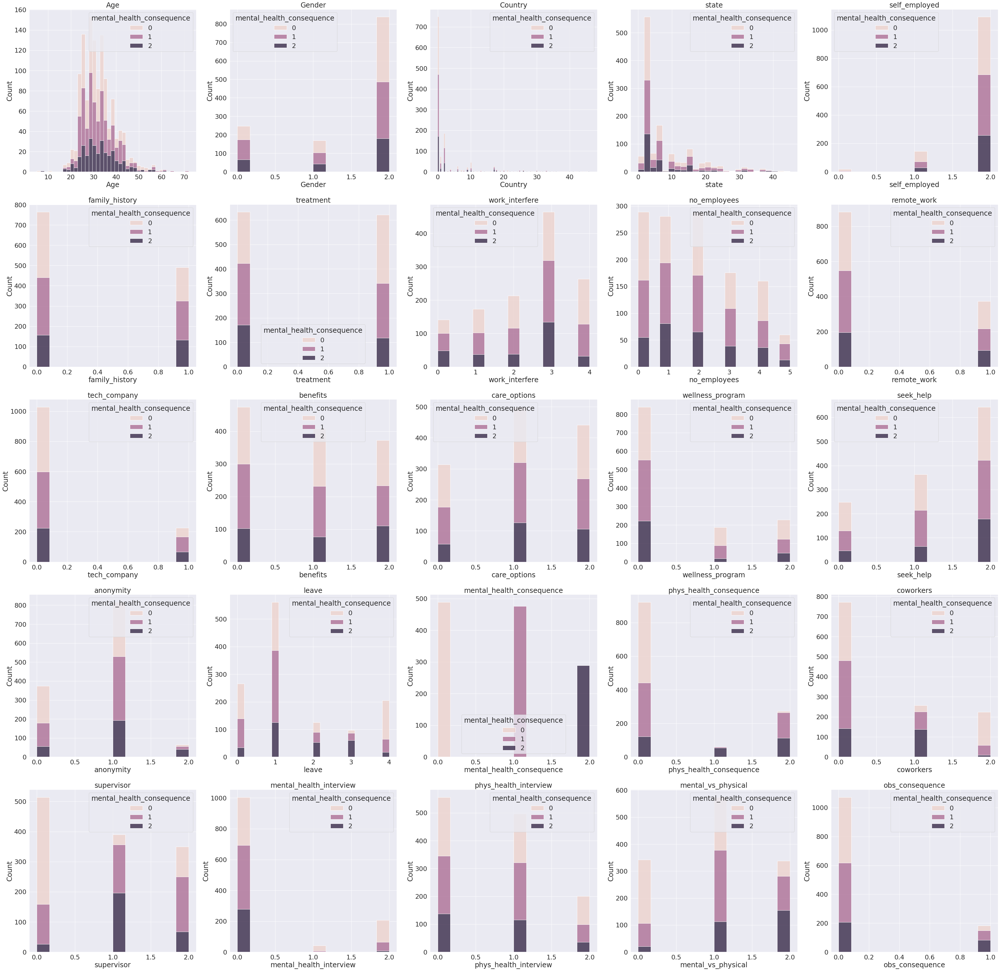

In [ ]:
get_histogram_hue(df,'mental_health_consequence')

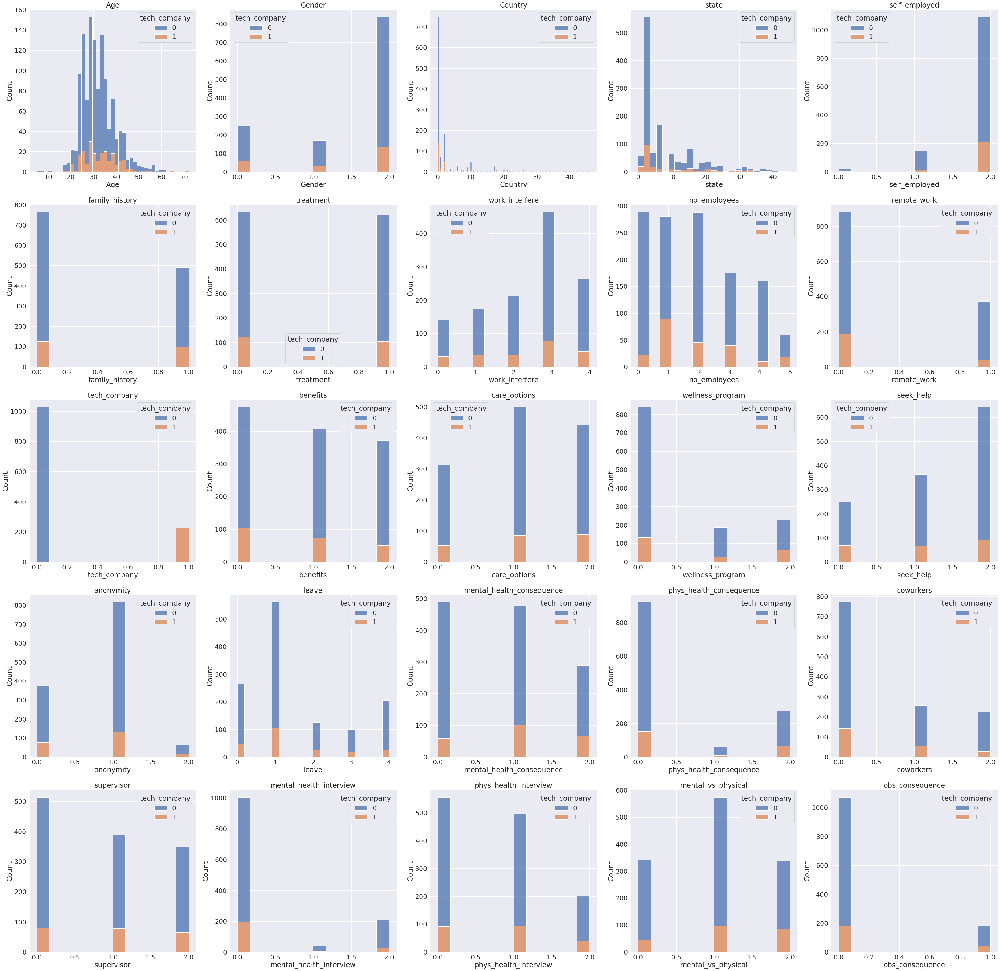

In [ ]:
get_histogram_hue(df,'tech_company')

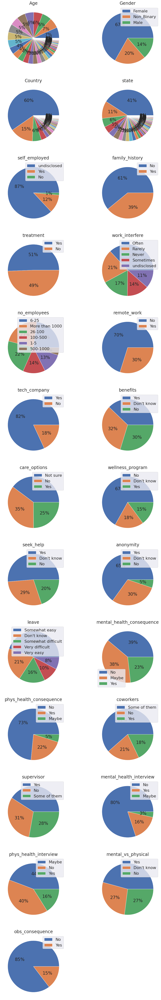

In [ ]:
def investigate_class_inbalance(df):
  """
  Investigate signicant class inbalance potential and print visual
  Author: Jacqueline Girouard

  Input
  -----
  df: dataframe

  """
  plot_max = len(list(df.columns))+1
  plot_count = 1
  fig = plt.figure(figsize=(17, 100))
  for (columnName, columnData) in df.iteritems():
    ax = fig.add_subplot(int(plot_max/2), 2, plot_count, xticks=[], yticks=[])
    ax.pie(columnData.value_counts(), autopct='%.0f%%')
    if len(columnData.unique()) < 7:
      ax.legend(columnData.unique())
    ax.set_title("{}".format(columnName))

    plot_count += 1

investigate_class_inbalance(df_cat)

df = df.drop(columns=['self_employed'])

Note: Gender imbalance

In [ ]:
def pair_plot_df(df, comp_features, y_col):
  """
    Creat pairwise plot for data correlation, noting target feature
    Author: Jacqueline Girouard

    Input
    -----
    model: skylearn classifying model

    df: dataframe
      orginal df for preprocessing

    comp_features: list(str)
      list of features to compare

    y_col:
        Target feature for predictive model
  """
  df = df[comp_features]
  g = sns.pairplot(df, hue=y_col, height=7, aspect=0.6)

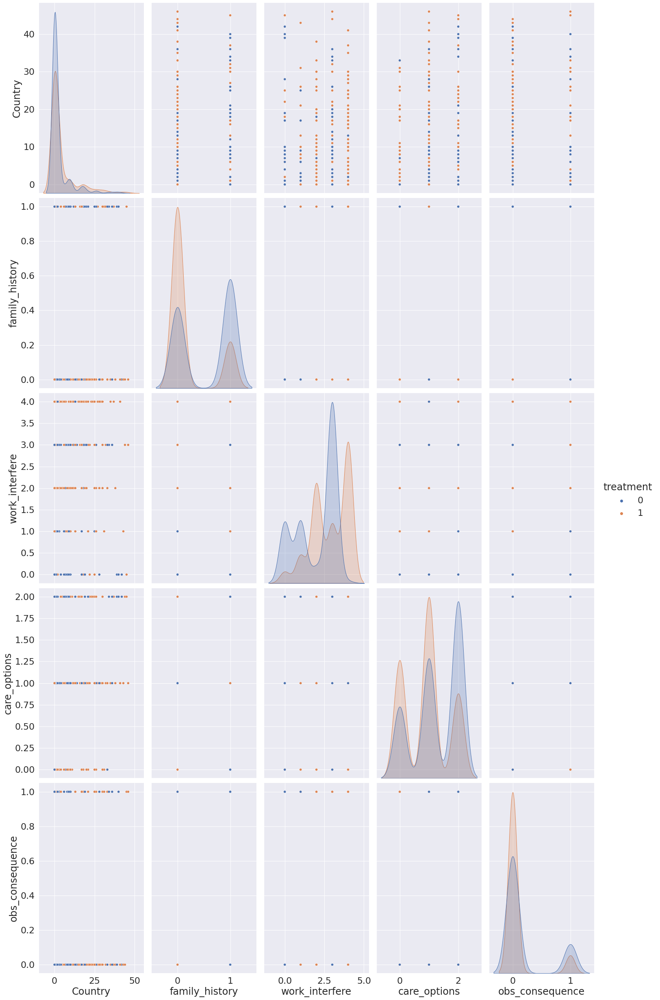

In [ ]:
potential_cols = ['treatment', 'mental_health_consequence', 'tech_company', 'no_employees', 'supervisor', 'coworkers']
potential_cols = ['treatment', 'Country', 'family_history', 'work_interfere', 'care_options', 'obs_consequence']
pair_plot_df(df , potential_cols, 'treatment')

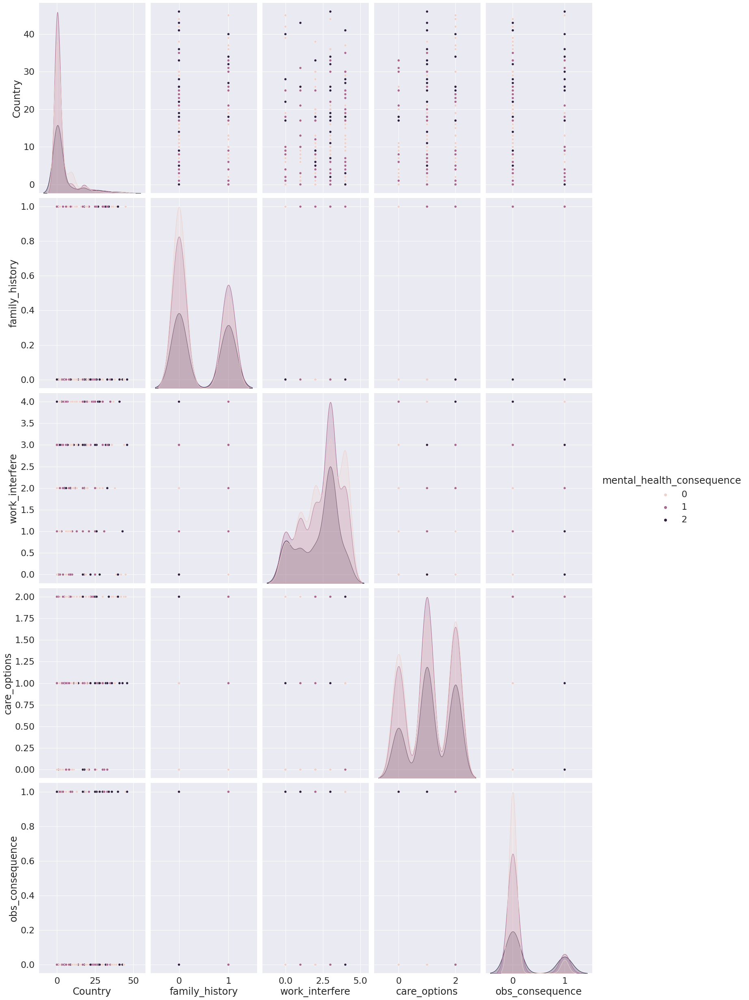

In [ ]:
potential_cols = ['mental_health_consequence', 'Country', 'family_history', 'work_interfere', 'care_options', 'obs_consequence']
pair_plot_df(df , potential_cols, 'mental_health_consequence')

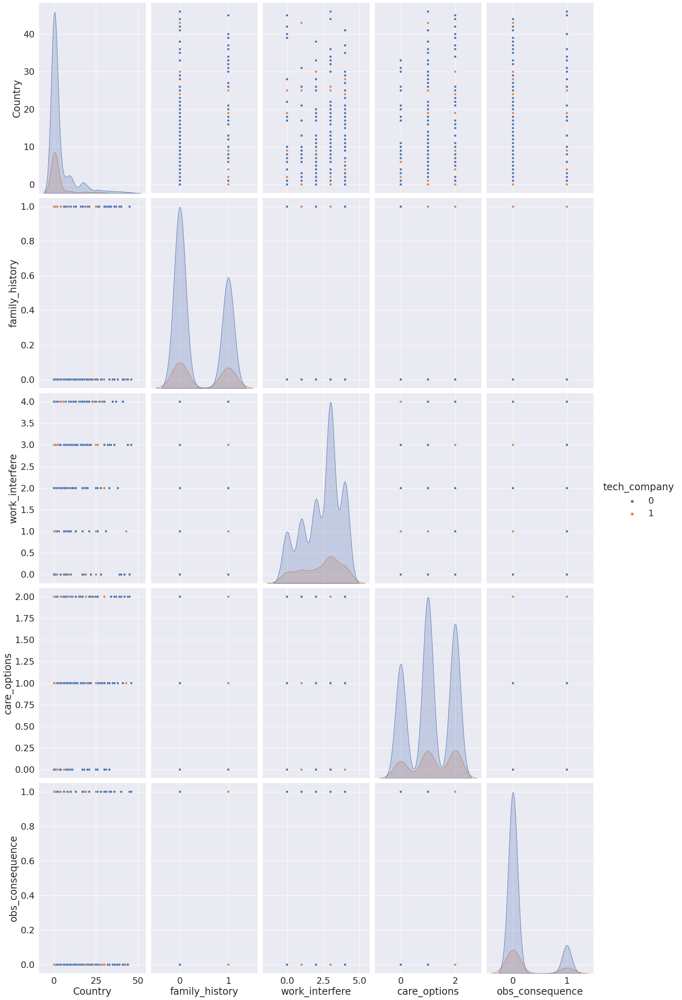

In [ ]:
potential_cols = ['tech_company', 'Country', 'family_history', 'work_interfere', 'care_options', 'obs_consequence']
pair_plot_df(df , potential_cols, 'tech_company')

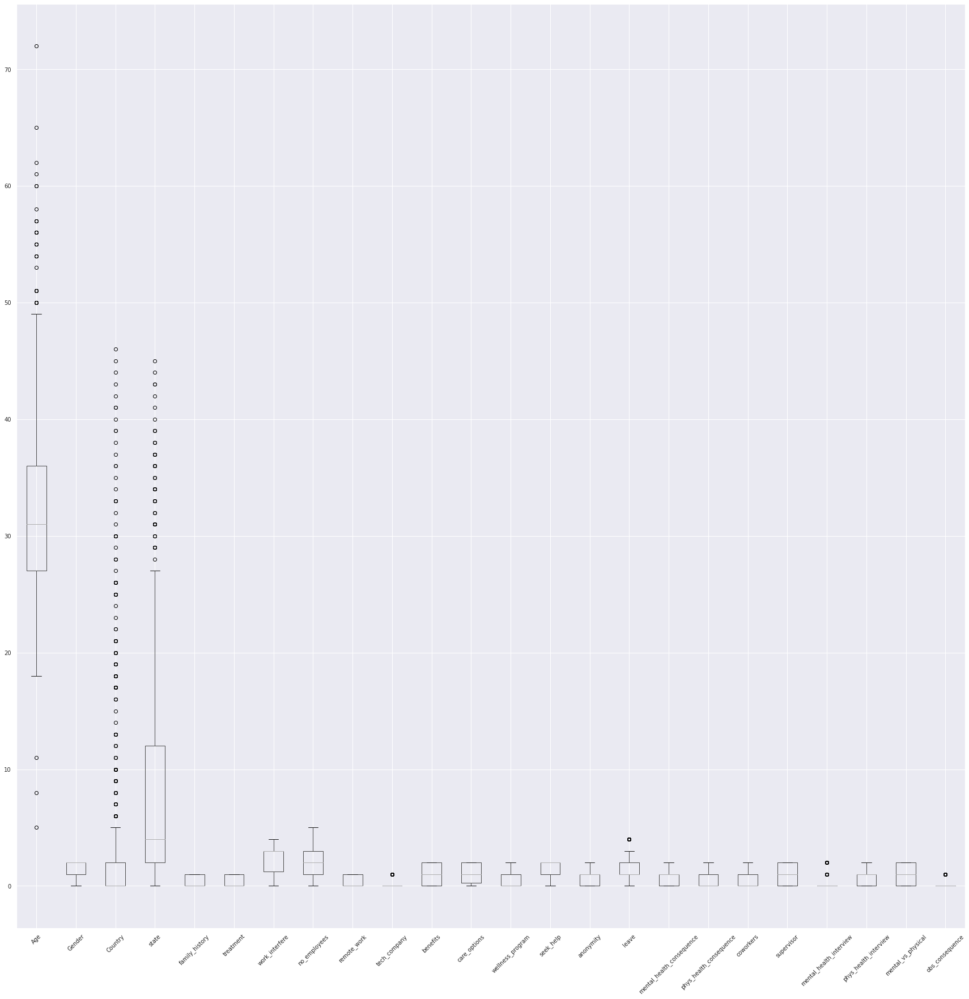

In [ ]:
df.boxplot(figsize=(30,30), rot=45, fontsize=10)

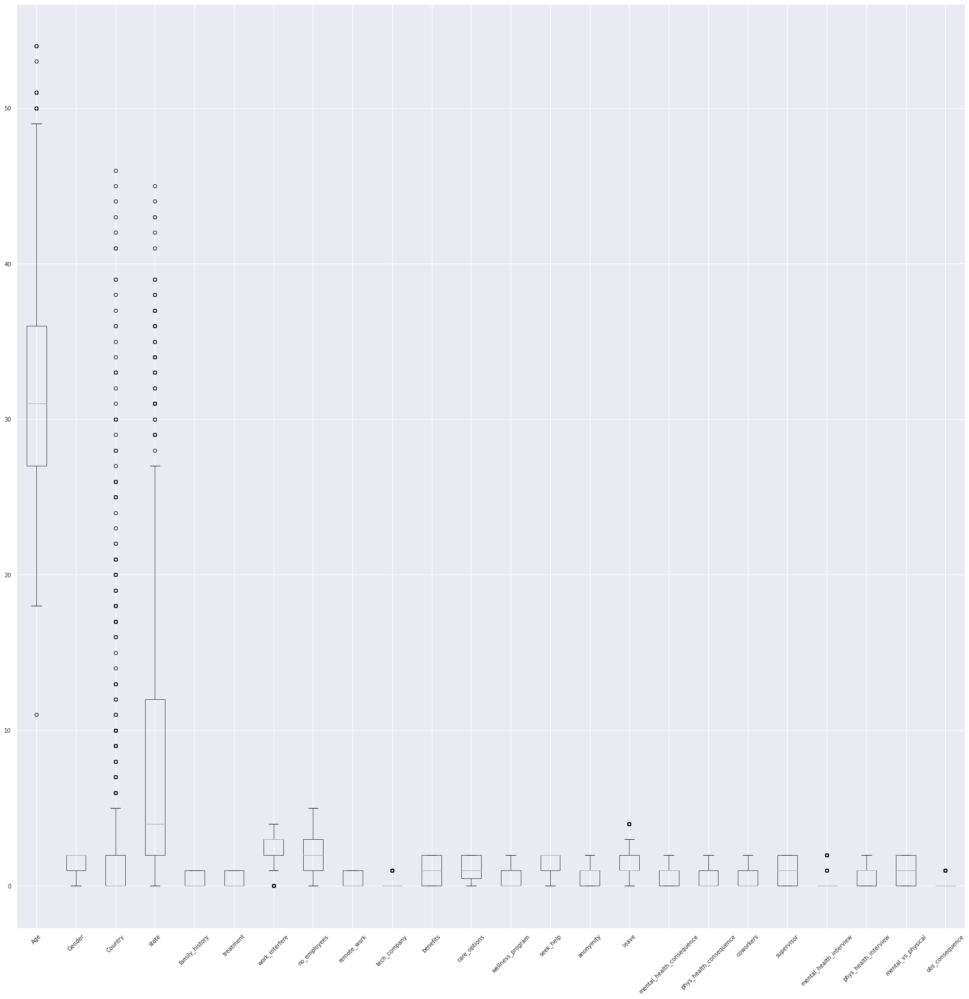

In [ ]:
def remove_outliers(df, col_name):
  """
    Remove entries from given column with an outlier

    Input
    -----
    df: dataframe
    """
  df = df[(np.abs(stats.zscore(df[col_name])) < 3)]
  return df

df = remove_outliers(df, "Age")
df.boxplot(figsize=(30,30), rot=45, fontsize=10)

In [ ]:
summary = summary_statistics(df)
display(summary)

,Age,Gender,Country,state,family_history,treatment,work_interfere,no_employees,remote_work,tech_company,...,anonymity,leave,mental_health_consequence,phys_health_consequence,coworkers,supervisor,mental_health_interview,phys_health_interview,mental_vs_physical,obs_consequence
count,1235.000000,1235.000000,1235.000000,1235.000000,1235.000000,1235.000000,1235.000000,1235.000000,1235.000000,1235.000000,...,1235.000000,1235.000000,1235.000000,1235.000000,1235.000000,1235.000000,1235.000000,1235.000000,1235.000000,1235.000000
mean,31.693117,1.471255,3.395142,8.147368,0.391903,0.497976,2.435628,1.853441,0.295547,0.180567,...,0.753036,1.536032,0.837247,0.472874,0.559514,0.872874,0.364372,0.717409,1.000000,0.142510
std,6.632925,0.804026,7.337277,8.854633,0.488373,0.500198,1.268504,1.485334,0.456473,0.384815,...,0.538378,1.344641,0.771392,0.822023,0.775629,0.820642,0.751030,0.723744,0.735751,0.349714
min,11.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,27.000000,1.000000,0.000000,2.000000,0.000000,0.000000,2.000000,1.000000,0.000000,0.000000,...,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,31.000000,2.000000,0.000000,4.000000,0.000000,0.000000,3.000000,2.000000,0.000000,0.000000,...,1.000000,1.000000,1.000000,0.000000,0.000000,1.000000,0.000000,1.000000,1.000000,0.000000
75%,36.000000,2.000000,2.000000,12.000000,1.000000,1.000000,3.000000,3.000000,1.000000,0.000000,...,1.000000,2.000000,1.000000,1.000000,1.000000,2.000000,0.000000,1.000000,2.000000,0.000000
max,54.000000,2.000000,46.000000,45.000000,1.000000,1.000000,4.000000,5.000000,1.000000,1.000000,...,2.000000,4.000000,2.000000,2.000000,2.000000,2.000000,2.000000,2.000000,2.000000,1.000000
var,43.995698,0.646458,53.835633,78.404521,0.238508,0.250198,1.609102,2.206218,0.208368,0.148082,...,0.289851,1.808060,0.595046,0.675722,0.601601,0.673453,0.564046,0.523805,0.541329,0.122300


### **Part** 3: Evaluation Code

In [ ]:
from sklearn.metrics import accuracy_score, precision_score, recall_score, classification_report
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay, roc_curve, auc
from itertools import cycle
from sklearn.preprocessing import label_binarize

def basic_report(model_name, model, X_test, y_test, ax):
    """
    Print model statistics
    Author: Jacqueline Girouard

    Input
    -----
    model: skylearn classifying model

    X_test:
        Array of testing features

    y_test:
        Array of testing classifications

    ax:
      Axis to plot subplot
    """
    print("\nStatistics for model with {}\n".format(model_name))
    y_pred = model.predict(X_test)
    accuracy = accuracy_score(y_test, y_pred)
    print("Accuracy: {}\n".format(accuracy))
    precision = precision_score(y_test, y_pred, average='weighted')
    recall = recall_score(y_test, y_pred, average='weighted')
    print("Precision: {}  Recall: {} \n".format(precision, recall))
    print("Classification Report: ")
    print(classification_report(y_test, y_pred))
    print("Confusion matrix :                                      ROC Curve :")
    cm = confusion_matrix(y_test, y_pred)
    disp = ConfusionMatrixDisplay(confusion_matrix=cm)
    disp.plot(ax=ax)
    return


In [ ]:
from sklearn.metrics import accuracy_score, precision_score, recall_score, classification_report
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay, roc_curve, auc
from itertools import cycle

def plot_roc_curve(y_score, y_test, ax):
  """
  Plots the roc curve figure.
  Author: Joanna Ng

    Input
    -----
    y_score:
      Array of score classifications for the y value

    y_test:
      Array of test classifications for the y value

    ax:
      Axis to plot subplot
  """
  fpr = dict()
  tpr = dict()
  roc_auc = dict()
  if n_classes <= 2:
    fpr, tpr, _ = roc_curve(y_test, y_score)
    roc_auc = auc(fpr, tpr)
    # Plot ROC curve
    plt.plot(fpr, tpr, label='ROC curve (area = %0.2f)' % roc_auc)
    plt.plot([0, 1], [0, 1], 'k--')  # random predictions curve
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.0])
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title('Receiver Operating Characteristic (ROC) curve')
    plt.legend(loc="lower right")
  else:
    for i in range(n_classes):
        fpr[i], tpr[i], _ = roc_curve(y_test[:, i], y_score[:, i])
        roc_auc[i] = auc(fpr[i], tpr[i])

    colors = cycle(["aqua", "darkorange", "darkgreen", "yellow", "blue"])
    for i, color in zip(range(n_classes), colors):
      plt.plot(fpr[i], tpr[i], color=color, lw=n_classes,
      label="ROC curve of class {0} (area = {1:0.2f})".format(i, roc_auc[i]),)

    plt.plot([0, 1], [0, 1], "k--", lw=n_classes)
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel("False Positive Rate")
    plt.ylabel("True Positive Rate")
    plt.title("Receiver Operating Characteristic (ROC) curve")
    plt.legend()
  plt.show(ax)

In [ ]:
from sklearn.multiclass import OneVsRestClassifier
from sklearn.preprocessing import label_binarize

def plot_roc_curve_model(model, arg, n_classes, X, y, ax):
  """
  Plot the roc curve for the respective model.
  Author: Joanna Ng

    Input
    -----
    model:
      Model name

    arg:
      max depth for decision tree or kernel function for svm

    n_classes:
      number of unique classifications for the y value

    X:
      X values from dataset

    y:
      y values from dataset for the target value to delve into

    ax:
      Axis to plot subplot

  """
  classes = []
  for i in range(n_classes):
    classes.append(i)
  y = label_binarize(y, classes=classes)
  n_classes = y.shape[1]

  X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2)

  if model == 'svm':
    classifier = make_pipeline(StandardScaler(), SVC(kernel=arg, gamma='auto'))
    classifier = OneVsRestClassifier(classifier).fit(X_train, y_train)
    y_score = classifier.decision_function(X_test)
  elif model == 'dt':
    classifier = train_DecisionTreeClassifier(X_train, y_train, arg)
    y_score = classifier.predict(X_test)
  elif model == 'rf':
    classifier = train_RandomForestClassifier(X_train, y_train)
    y_score = classifier.predict(X_test)

  plot_roc_curve(y_score, y_test, ax)
  return

In [ ]:
# Author: Joanna Ng
# Function to print out and plot out model statistics and predictions
def report_models_info(model_name, model, X_test, y_test, model_type, arg, n_classes, X, y):
  f, axes = plt.subplots(1, 2, figsize=(20, 5))
  basic_report(model_name, model, X_test, y_test, axes[0])
  plot_roc_curve_model(model_type, arg, n_classes, X, y, axes[1])

Can we predict the following questions:

1) What is the likelihood someone has sought treatment for a mental health condition?

2) Can we predict if someone anticipates discussing a mental health issue with an employer to have negative consequences?

3) Do qualities relating to mental health indicate a likihood of being in the tech industry?

In [ ]:
# from google.colab import drive
# drive.mount('/content/drive')

### Models

In [ ]:
## Train SVM
from sklearn.svm import SVC
from sklearn.pipeline import make_pipeline
from sklearn.preprocessing import StandardScaler

def train_svm(X, y, kernel_function):
  """
  Train SVM with training data and specified kernel function
  Author: Jacqueline Girouard

    Input
    -----
    model: skylearn classifying model

    X:
      Array of training features

    y:
      Array of training classifications

    kernel_function:
      function for svm kernel
  """
  kernels = ['linear', 'poly', 'rbf']
  assert kernel_function in kernels, "bad kernel function"

  clf = make_pipeline(StandardScaler(), SVC(kernel=kernel_function, gamma='auto'))
  clf.fit(X, y)
  return clf

In [ ]:
## Train DecisionTreeClassifier
from sklearn.tree import DecisionTreeClassifier

def train_DecisionTreeClassifier(X, y, max_depth):
  """
  Train DecisionTreeClassifier with training data
  Author: Joanna Ng

    Input
    -----
    X_train:
      Array of training features

    y_train:
      Array of training classifications

    max_depth:
      Specifiy the maximum depth of the Decision Tree

  """
  if max_depth == None:
    clf = DecisionTreeClassifier().fit(X, y)
  else:
    clf = DecisionTreeClassifier(max_depth=max_depth).fit(X, y)
  return clf

In [ ]:
## Train RandomForestClassifier
from sklearn.ensemble import RandomForestClassifier
def train_RandomForestClassifier(X, y):
  """
  Train Random Forest Classifier with training data
  Author: Aisha Kothare

    Input
    -----
    X_train:
      Array of training features

    y_train:
      Array of training classifications

  """
  clf = RandomForestClassifier(n_estimators = 100)
  clf.fit(X, y)
  return clf

In [ ]:
#Model Prediction Accuracies
def model_prediction_accuracies(model_values, X_train, y_train, X_test, y_test):
    """
    The accuracies of the model predictions
    Author: Joanna Ng

      Input
      -----
      model_values:
        values of each of the models

      X_train:
        Array of training features

      y_train:
        Array of training classifications

      X_test:
        Array of testing features

      y_test:
        Array of testing classifcations
    """
    model_names = ['Linear SVM', 'Poly SVM', 'RBF SVM', 'DecisionTreeClassifier', 'DecisionTreeClassifier Max Depth 2', 'DecisionTreeClassifier Max Depth 5', 'RandomForestClassifier']
    models = dict(zip(model_names,model_values))

    predicted_values =[]
    for model_name,model in models.items():
        y_pred = model.predict(X_test)
        accuracy = accuracy_score(y_test, y_pred)
        predicted_values.append(accuracy)
        print(model_name,accuracy)

    plt.figure(figsize = (10,5))
    ax = sns.barplot(x = predicted_values, y = model_names, palette='Blues')
    plt.title("Model Accuracy Predictions", fontsize=14, fontweight="bold")

Part 4: Model Builting and Testing for Question 1:

##**What is the likelihood for someone having sought treatment for a mental health condition?**

In [ ]:
from sklearn.model_selection import train_test_split
y = df['treatment'].to_numpy()
X = df.loc[:, df.columns != 'treatment'].to_numpy()
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2,  random_state=1)
n_classes = df['treatment'].unique().size
model_values = []


Statistics for model with SVM linear kernel

Accuracy: 0.7449392712550608

Precision: 0.7476699146644071  Recall: 0.7449392712550608 

Classification Report: 
              precision    recall  f1-score   support

           0       0.78      0.73      0.75       133
           1       0.71      0.76      0.73       114

    accuracy                           0.74       247
   macro avg       0.74      0.75      0.74       247
weighted avg       0.75      0.74      0.75       247

Confusion matrix :                                      ROC Curve :


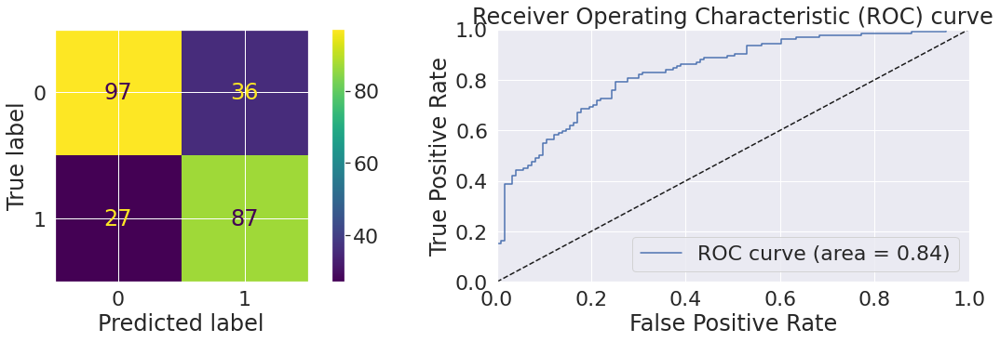

In [ ]:
## Evaluate Linear SVM
linear_model = train_svm(X_train, y_train, 'linear')
model_values.append(linear_model)
report_models_info("SVM linear kernel", linear_model, X_test, y_test, 'svm', 'linear', n_classes, X, y)


Statistics for model with SVM polynomial kernel

Accuracy: 0.708502024291498

Precision: 0.7149243918474687  Recall: 0.708502024291498 

Classification Report: 
              precision    recall  f1-score   support

           0       0.76      0.67      0.71       133
           1       0.66      0.75      0.70       114

    accuracy                           0.71       247
   macro avg       0.71      0.71      0.71       247
weighted avg       0.71      0.71      0.71       247

Confusion matrix :                                      ROC Curve :


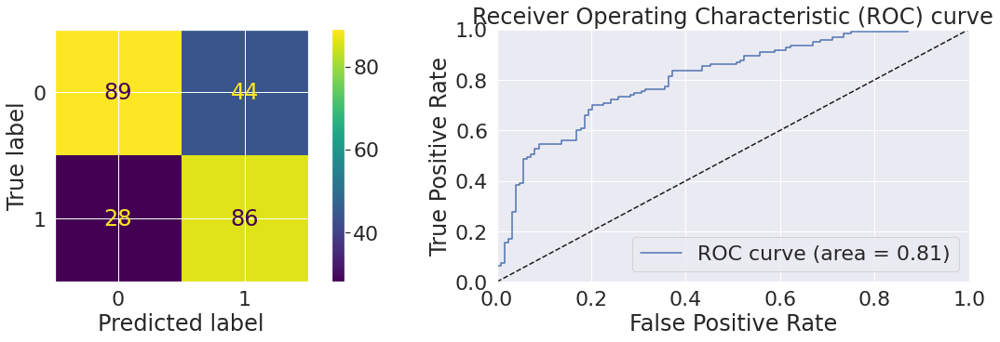

In [ ]:
## Evaluate Polynomial SVM
poly_model = train_svm(X_train, y_train, 'poly')
model_values.append(poly_model)
report_models_info("SVM polynomial kernel", poly_model, X_test, y_test, 'svm', 'poly', n_classes, X, y)


Statistics for model with SVM RBF kernel

Accuracy: 0.728744939271255

Precision: 0.7283692063103828  Recall: 0.728744939271255 

Classification Report: 
              precision    recall  f1-score   support

           0       0.74      0.76      0.75       133
           1       0.71      0.69      0.70       114

    accuracy                           0.73       247
   macro avg       0.73      0.73      0.73       247
weighted avg       0.73      0.73      0.73       247

Confusion matrix :                                      ROC Curve :


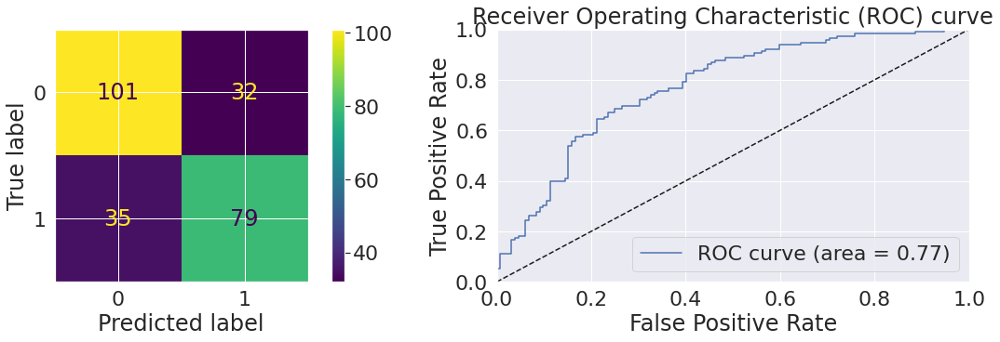

In [ ]:
## Evaluate Radial Basis Function SVM
rbf_model = train_svm(X_train, y_train, 'rbf')
model_values.append(rbf_model)
report_models_info("SVM RBF kernel", rbf_model, X_test, y_test, 'svm', 'rbf', n_classes, X, y)


Statistics for model with Decision Tree Classifier

Accuracy: 0.757085020242915

Precision: 0.7613295795113977  Recall: 0.757085020242915 

Classification Report: 
              precision    recall  f1-score   support

           0       0.80      0.73      0.76       133
           1       0.71      0.79      0.75       114

    accuracy                           0.76       247
   macro avg       0.76      0.76      0.76       247
weighted avg       0.76      0.76      0.76       247

Confusion matrix :                                      ROC Curve :


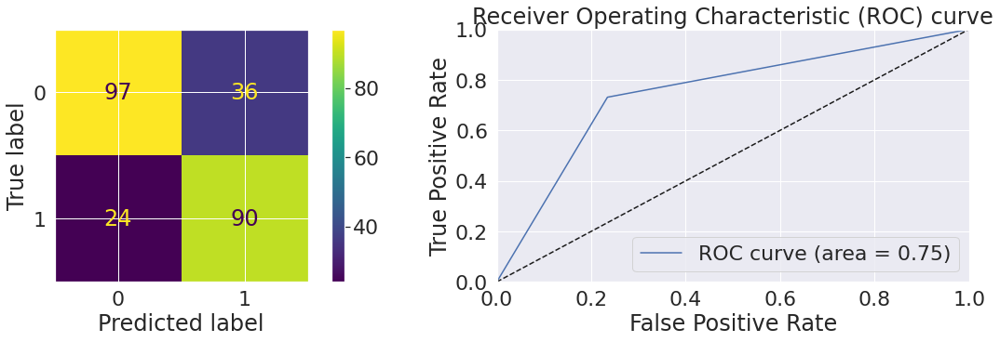

In [ ]:
## Evaluate Decision Tree
decisiontree_model = train_DecisionTreeClassifier(X_train, y_train, None)
model_values.append(decisiontree_model)
report_models_info("Decision Tree Classifier", decisiontree_model, X_test, y_test, 'dt', None, n_classes, X, y)


Statistics for model with Decision Tree Classifier with Max Depth of 2

Accuracy: 0.7044534412955465

Precision: 0.7366274679037652  Recall: 0.7044534412955465 

Classification Report: 
              precision    recall  f1-score   support

           0       0.83      0.57      0.68       133
           1       0.63      0.86      0.73       114

    accuracy                           0.70       247
   macro avg       0.73      0.72      0.70       247
weighted avg       0.74      0.70      0.70       247

Confusion matrix :                                      ROC Curve :


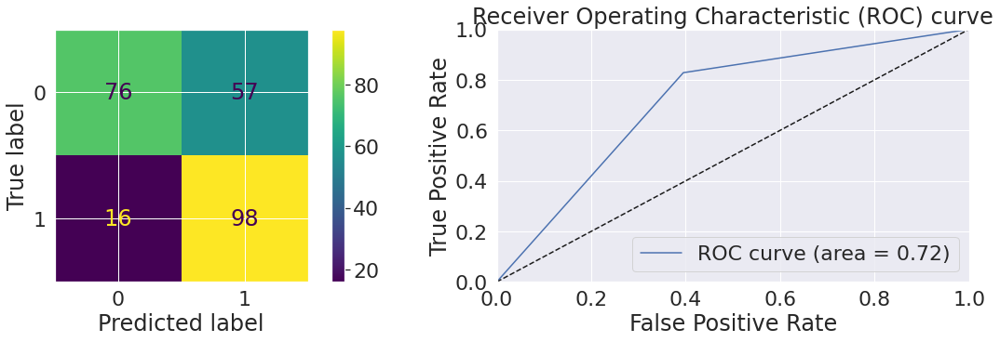

In [ ]:
## Evaluate Decision Tree with Max Depth = 2
decisiontree_model = train_DecisionTreeClassifier(X_train, y_train, 2)
model_values.append(decisiontree_model)
report_models_info("Decision Tree Classifier with Max Depth of 2", decisiontree_model, X_test, y_test, 'dt', 2, n_classes, X, y)


Statistics for model with Decision Tree Classifier with Max Depth of 5

Accuracy: 0.8461538461538461

Precision: 0.8463998032343355  Recall: 0.8461538461538461 

Classification Report: 
              precision    recall  f1-score   support

           0       0.84      0.88      0.86       133
           1       0.85      0.81      0.83       114

    accuracy                           0.85       247
   macro avg       0.85      0.84      0.84       247
weighted avg       0.85      0.85      0.85       247

Confusion matrix :                                      ROC Curve :


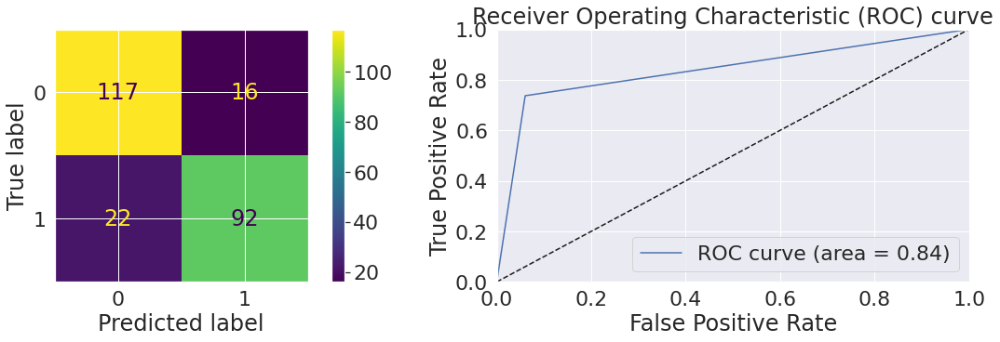

In [ ]:
## Evaluate Decision Tree with Max Depth = 5
decisiontree_model = train_DecisionTreeClassifier(X_train, y_train, 5)
model_values.append(decisiontree_model)
report_models_info("Decision Tree Classifier with Max Depth of 5", decisiontree_model, X_test, y_test, 'dt', 5, n_classes, X, y)


Statistics for model with Random Forest Classifier

Accuracy: 0.8178137651821862

Precision: 0.819930307045457  Recall: 0.8178137651821862 

Classification Report: 
              precision    recall  f1-score   support

           0       0.80      0.88      0.84       133
           1       0.84      0.75      0.79       114

    accuracy                           0.82       247
   macro avg       0.82      0.81      0.81       247
weighted avg       0.82      0.82      0.82       247

Confusion matrix :                                      ROC Curve :


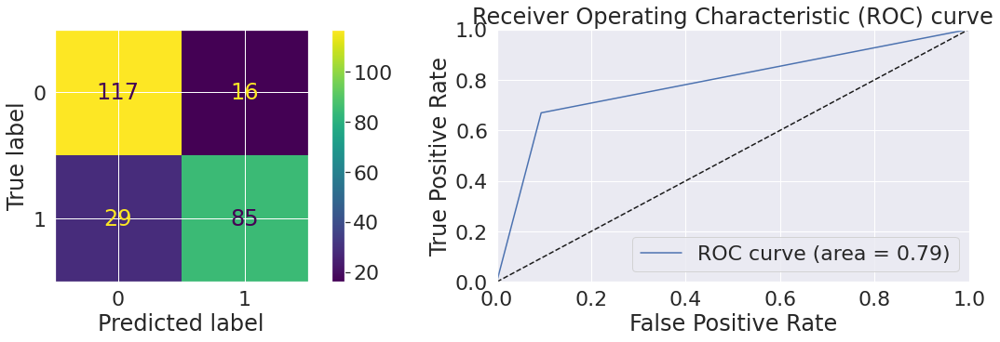

In [ ]:
random_forest = train_RandomForestClassifier(X_train,y_train)
model_values.append(random_forest)
report_models_info("Random Forest Classifier", random_forest, X_test, y_test, 'rf', None, n_classes, X, y)

Linear SVM 0.7449392712550608
Poly SVM 0.708502024291498
RBF SVM 0.728744939271255
DecisionTreeClassifier 0.757085020242915
DecisionTreeClassifier Max Depth 2 0.7044534412955465
DecisionTreeClassifier Max Depth 5 0.8461538461538461
RandomForestClassifier 0.8178137651821862


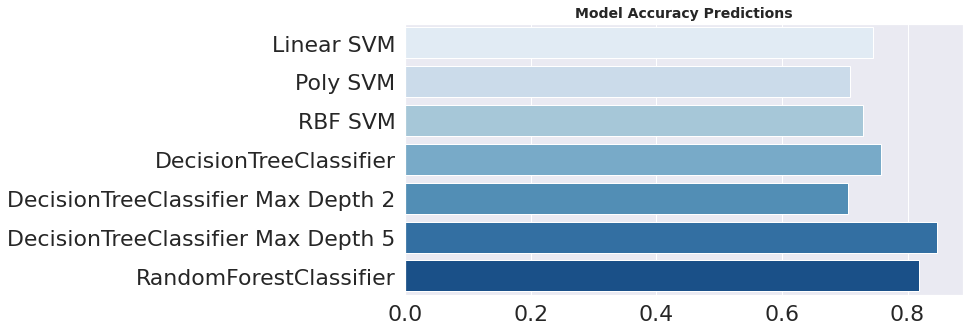

In [ ]:
model_prediction_accuracies(model_values, X_train, y_train, X_test, y_test)

## Discovering top 12 features:

In [ ]:
"""
Using features with more importance to train model and see difference. using top 12 features:
"""
# print(featureScores.nlargest(12,'Score'))
imp_features = []
imp_features = featureScores_treatment.nlargest(12,"Score")


In [ ]:
X_imp = df.loc[:, imp_features.Specs].to_numpy()
X_train_imp, X_test_imp, y_train, y_test = train_test_split(X_imp, y, test_size=0.2,  random_state=1)
model_values_imp = []

### Using SVM on Top 12 Features


Statistics for model with SVM linear kernel top features

Accuracy: 0.7327935222672065

Precision: 0.7359841836631766  Recall: 0.7327935222672065 

Classification Report: 
              precision    recall  f1-score   support

           0       0.77      0.71      0.74       133
           1       0.69      0.75      0.72       114

    accuracy                           0.73       247
   macro avg       0.73      0.73      0.73       247
weighted avg       0.74      0.73      0.73       247

Confusion matrix :                                      ROC Curve :


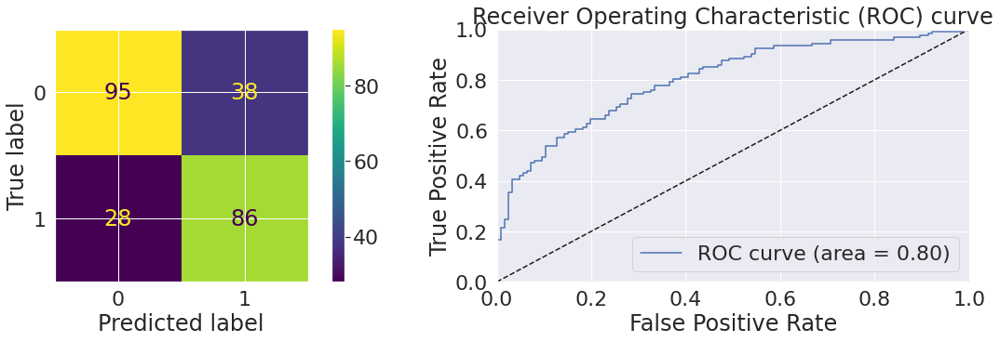

In [ ]:
## Evaluate Linear SVM Improved
linear_model = train_svm(X_train_imp, y_train, 'linear')
model_values_imp.append(linear_model)
report_models_info("SVM linear kernel top features", linear_model, X_test_imp, y_test, 'svm', 'linear', n_classes, X_imp, y)


Statistics for model with SVM Polynomial kernel top features

Accuracy: 0.7165991902834008

Precision: 0.7258770815764608  Recall: 0.7165991902834008 

Classification Report: 
              precision    recall  f1-score   support

           0       0.78      0.66      0.72       133
           1       0.66      0.78      0.72       114

    accuracy                           0.72       247
   macro avg       0.72      0.72      0.72       247
weighted avg       0.73      0.72      0.72       247

Confusion matrix :                                      ROC Curve :


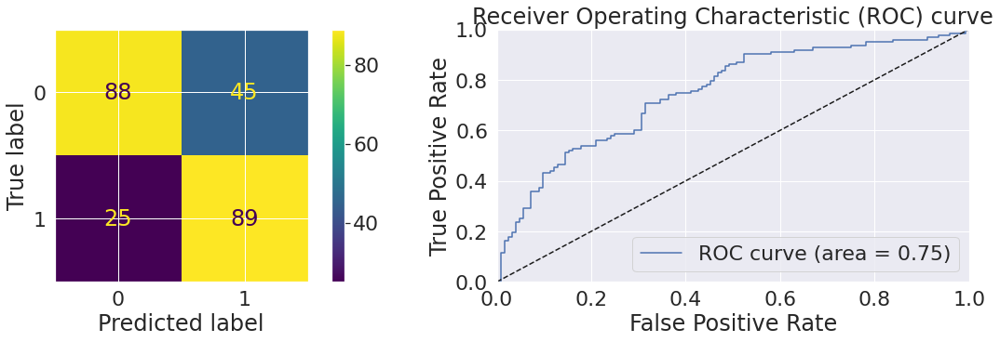

In [ ]:
## Evaluate Polynomial SVM Improved
poly_model = train_svm(X_train_imp, y_train, 'poly')
model_values_imp.append(poly_model)
report_models_info("SVM Polynomial kernel top features", poly_model, X_test_imp, y_test, 'svm', 'poly', n_classes, X_imp, y)


Statistics for model with SVM RBF kernel top features

Accuracy: 0.7165991902834008

Precision: 0.7258770815764608  Recall: 0.7165991902834008 

Classification Report: 
              precision    recall  f1-score   support

           0       0.78      0.66      0.72       133
           1       0.66      0.78      0.72       114

    accuracy                           0.72       247
   macro avg       0.72      0.72      0.72       247
weighted avg       0.73      0.72      0.72       247

Confusion matrix :                                      ROC Curve :


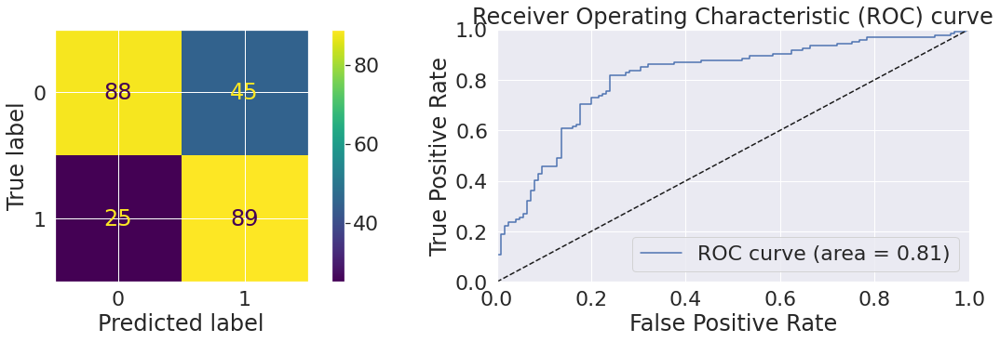

In [ ]:
## Evaluate Radial Basis Function SVM Improved
rbf_model = train_svm(X_train_imp, y_train, 'rbf')
model_values_imp.append(rbf_model)
report_models_info("SVM RBF kernel top features", poly_model, X_test_imp, y_test, 'svm', 'rbf', n_classes, X_imp, y)

### Using Decision Tree on Top 12 Features


Statistics for model with Decision Tree Classifier Improved

Accuracy: 0.7246963562753036

Precision: 0.7262568140520896  Recall: 0.7246963562753036 

Classification Report: 
              precision    recall  f1-score   support

           0       0.76      0.72      0.74       133
           1       0.69      0.73      0.71       114

    accuracy                           0.72       247
   macro avg       0.72      0.72      0.72       247
weighted avg       0.73      0.72      0.73       247

Confusion matrix :                                      ROC Curve :


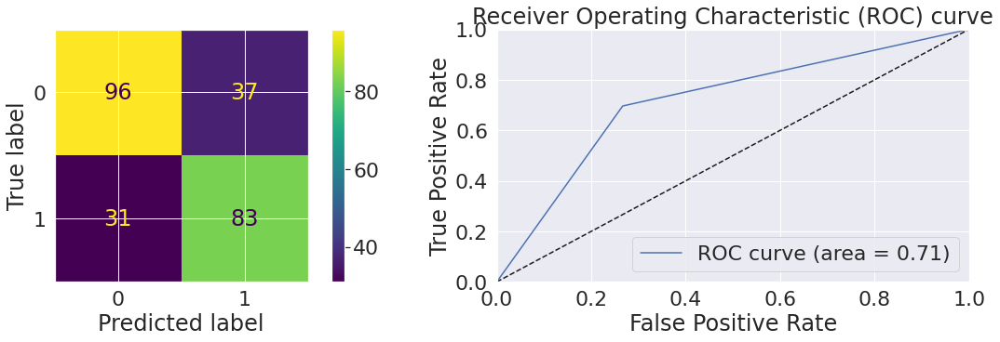

In [ ]:
## Evaluate Decision Tree Improved
decisiontree_model_imp = train_DecisionTreeClassifier(X_train_imp, y_train, None)
model_values_imp.append(decisiontree_model_imp)
report_models_info("Decision Tree Classifier Improved", decisiontree_model_imp, X_test_imp, y_test, 'dt', None, n_classes, X_imp, y)


Statistics for model with Decision Tree Classifier Improved with Max Depth 2

Accuracy: 0.7044534412955465

Precision: 0.7366274679037652  Recall: 0.7044534412955465 

Classification Report: 
              precision    recall  f1-score   support

           0       0.83      0.57      0.68       133
           1       0.63      0.86      0.73       114

    accuracy                           0.70       247
   macro avg       0.73      0.72      0.70       247
weighted avg       0.74      0.70      0.70       247

Confusion matrix :                                      ROC Curve :


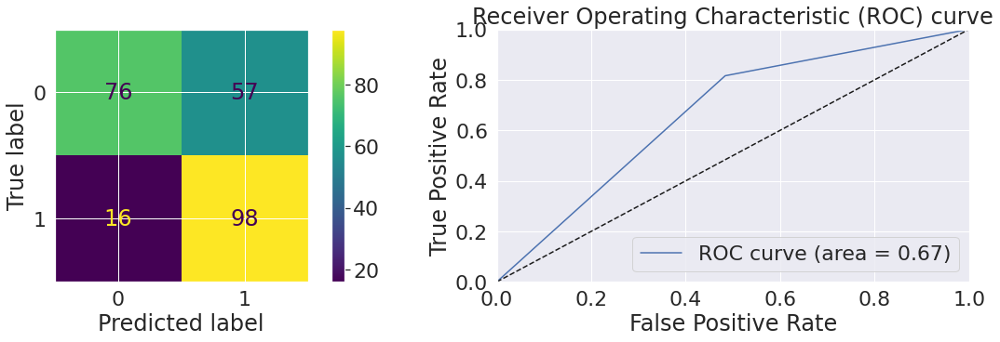

In [ ]:
## Evaluate Decision Tree with Max Depth = 2 Improved
decisiontree_model_imp = train_DecisionTreeClassifier(X_train_imp, y_train, 2)
model_values_imp.append(decisiontree_model_imp)
report_models_info("Decision Tree Classifier Improved with Max Depth 2", decisiontree_model_imp, X_test_imp, y_test, 'dt', 2, n_classes, X_imp, y)


Statistics for model with Decision Tree Classifier Improved with Max Depth 5

Accuracy: 0.8461538461538461

Precision: 0.8463998032343355  Recall: 0.8461538461538461 

Classification Report: 
              precision    recall  f1-score   support

           0       0.84      0.88      0.86       133
           1       0.85      0.81      0.83       114

    accuracy                           0.85       247
   macro avg       0.85      0.84      0.84       247
weighted avg       0.85      0.85      0.85       247

Confusion matrix :                                      ROC Curve :


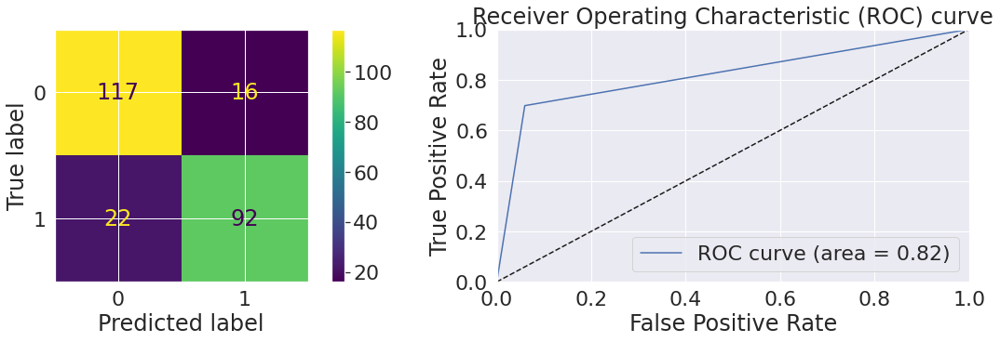

In [ ]:
## Evaluate Decision Tree with Max Depth = 5 Improved
decisiontree_model_imp = train_DecisionTreeClassifier(X_train_imp, y_train, 5)
model_values_imp.append(decisiontree_model_imp)
report_models_info("Decision Tree Classifier Improved with Max Depth 5", decisiontree_model_imp, X_test_imp, y_test, 'dt', 5, n_classes, X_imp, y)

### Using Random Forest on Top 12 Features


Statistics for model with Random Forest Classifier Improved

Accuracy: 0.8259109311740891

Precision: 0.8262041696621136  Recall: 0.8259109311740891 

Classification Report: 
              precision    recall  f1-score   support

           0       0.82      0.86      0.84       133
           1       0.83      0.78      0.81       114

    accuracy                           0.83       247
   macro avg       0.83      0.82      0.82       247
weighted avg       0.83      0.83      0.83       247

Confusion matrix :                                      ROC Curve :


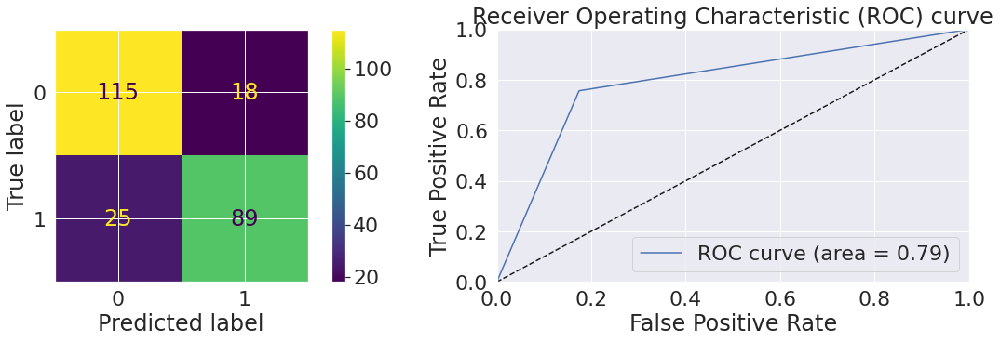

In [ ]:
## Evaluate Random Forest
random_forest_imp = train_RandomForestClassifier(X_train_imp,y_train)
model_values_imp.append(random_forest_imp)
report_models_info("Random Forest Classifier Improved", random_forest_imp, X_test_imp, y_test, 'rf', None, n_classes, X_imp, y)

### Predicting the improved model accuracies

Linear SVM 0.7327935222672065
Poly SVM 0.7165991902834008
RBF SVM 0.7206477732793523
DecisionTreeClassifier 0.7246963562753036
DecisionTreeClassifier Max Depth 2 0.7044534412955465
DecisionTreeClassifier Max Depth 5 0.8461538461538461
RandomForestClassifier 0.8259109311740891


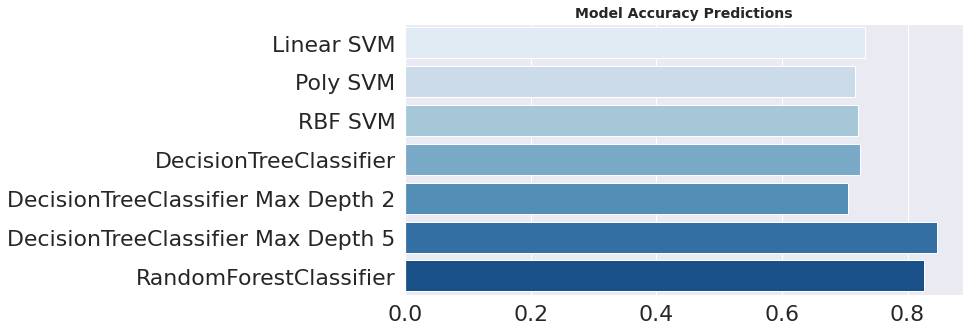

In [ ]:
model_prediction_accuracies(model_values_imp, X_train_imp, y_train, X_test_imp, y_test)

Part 4: Model Building and Testing for Question 2:

##**Can we predict if someone anticipates discussing a mental health issue with an employer to have negative consequences?**

In [ ]:
from sklearn.model_selection import train_test_split
y = df['mental_health_consequence'].to_numpy()
X = df.loc[:, df.columns != 'mental_health_consequence'].to_numpy()
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2,  random_state=1)
model_values = []
n_classes = df['mental_health_consequence'].unique().size

## SVM using linear, polynomial and radial basis kernels


Statistics for model with SVM linear kernel

Accuracy: 0.6558704453441295

Precision: 0.6530005195855869  Recall: 0.6558704453441295 

Classification Report: 
              precision    recall  f1-score   support

           0       0.77      0.81      0.79       103
           1       0.56      0.64      0.60        84
           2       0.58      0.42      0.49        60

    accuracy                           0.66       247
   macro avg       0.64      0.62      0.62       247
weighted avg       0.65      0.66      0.65       247

Confusion matrix :                                      ROC Curve :


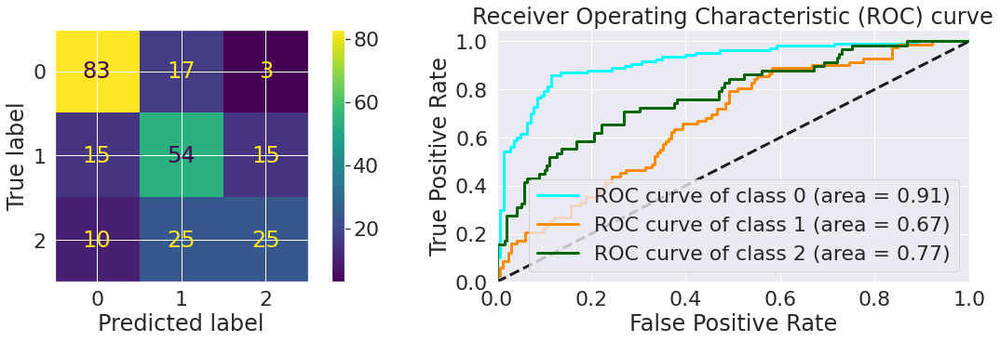

In [ ]:
## Evaluate Linear SVM
linear_model = train_svm(X_train, y_train, 'linear')
model_values.append(linear_model)
report_models_info("SVM linear kernel", linear_model, X_test, y_test, 'svm', 'linear', n_classes, X, y)


Statistics for model with SVM polynomial kernel

Accuracy: 0.8299595141700404

Precision: 0.8642470710472573  Recall: 0.8299595141700404 

Classification Report: 
              precision    recall  f1-score   support

           0       0.91      0.91      0.91       103
           1       0.71      0.95      0.81        84
           2       1.00      0.52      0.68        60

    accuracy                           0.83       247
   macro avg       0.87      0.79      0.80       247
weighted avg       0.86      0.83      0.82       247

Confusion matrix :                                      ROC Curve :


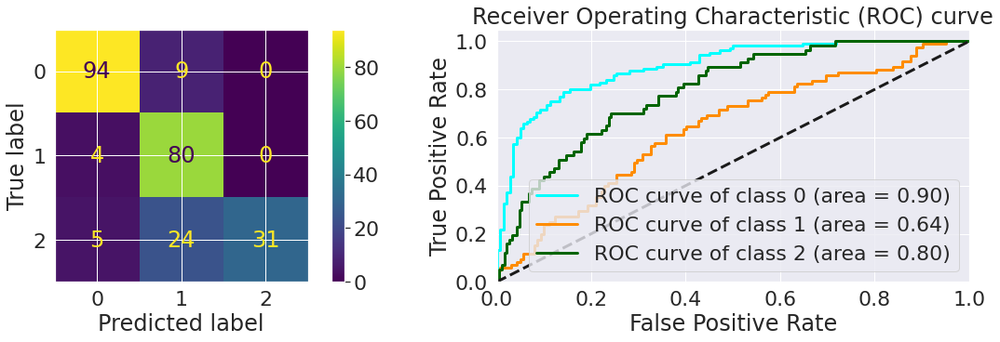

In [ ]:
## Evaluate Polynomial SVM
poly_model = train_svm(X, y, 'poly')
model_values.append(poly_model)
report_models_info("SVM polynomial kernel", poly_model, X_test, y_test, 'svm', 'poly', n_classes, X, y)


Statistics for model with SVM RBF kernel

Accuracy: 0.6558704453441295

Precision: 0.6530005195855869  Recall: 0.6558704453441295 

Classification Report: 
              precision    recall  f1-score   support

           0       0.77      0.81      0.79       103
           1       0.56      0.64      0.60        84
           2       0.58      0.42      0.49        60

    accuracy                           0.66       247
   macro avg       0.64      0.62      0.62       247
weighted avg       0.65      0.66      0.65       247

Confusion matrix :                                      ROC Curve :


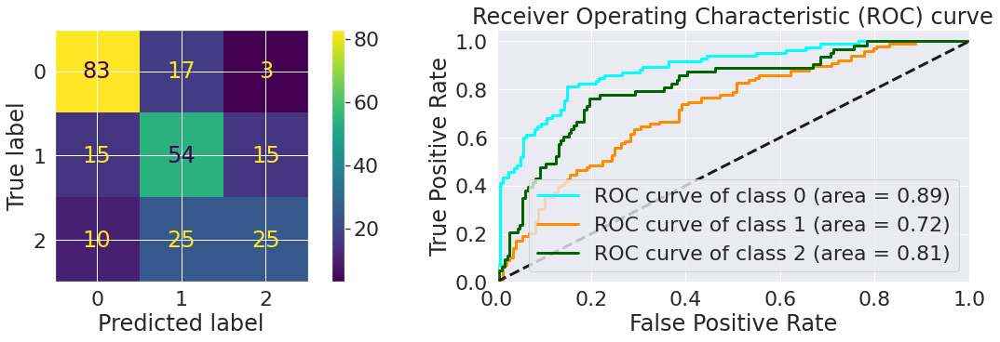

In [ ]:
## Evaluate Radial Basis Function SVM
rbf_model = train_svm(X, y, 'rbf')
model_values.append(rbf_model)
report_models_info("SVM RBF kernel", linear_model, X_test, y_test, 'svm', 'rbf', n_classes, X, y)

## Decision Tree default depth


Statistics for model with Decision Tree Classifier

Accuracy: 0.5465587044534413

Precision: 0.5573272129593427  Recall: 0.5465587044534413 

Classification Report: 
              precision    recall  f1-score   support

           0       0.72      0.66      0.69       103
           1       0.43      0.49      0.46        84
           2       0.45      0.43      0.44        60

    accuracy                           0.55       247
   macro avg       0.53      0.53      0.53       247
weighted avg       0.56      0.55      0.55       247

Confusion matrix :                                      ROC Curve :


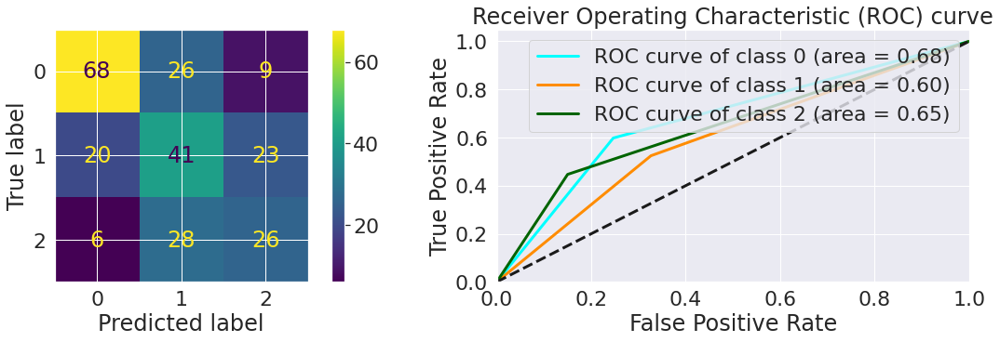

In [ ]:
## Evaluate Decision Tree
decisiontree_model = train_DecisionTreeClassifier(X_train, y_train, None)
model_values.append(decisiontree_model)
report_models_info("Decision Tree Classifier", decisiontree_model, X_test, y_test, 'dt', None, n_classes, X, y)

## Decision Tree, max depth 2


Statistics for model with Decision Tree Classifier with Max Depth of 2

Accuracy: 0.5870445344129555

Precision: 0.6020599273505612  Recall: 0.5870445344129555 

Classification Report: 
              precision    recall  f1-score   support

           0       0.78      0.71      0.74       103
           1       0.42      0.49      0.45        84
           2       0.55      0.52      0.53        60

    accuracy                           0.59       247
   macro avg       0.58      0.57      0.58       247
weighted avg       0.60      0.59      0.59       247

Confusion matrix :                                      ROC Curve :


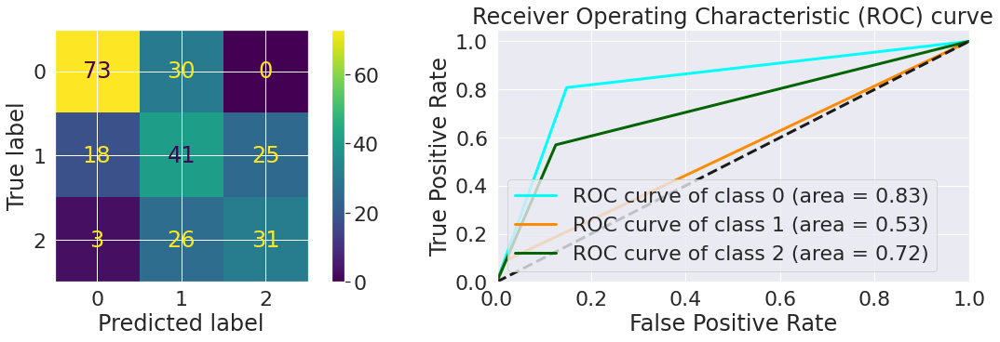

In [ ]:
## Evaluate Decision Tree with Max Depth = 2
decisiontree_model = train_DecisionTreeClassifier(X_train, y_train, 2)
model_values.append(decisiontree_model)
report_models_info("Decision Tree Classifier with Max Depth of 2", decisiontree_model, X_test, y_test, 'dt', 2, n_classes, X, y)

## Decision Tree, max depth 5


Statistics for model with Decision Tree Classifier with Max Depth of 5

Accuracy: 0.631578947368421

Precision: 0.6276995712051241  Recall: 0.631578947368421 

Classification Report: 
              precision    recall  f1-score   support

           0       0.75      0.80      0.77       103
           1       0.50      0.50      0.50        84
           2       0.59      0.53      0.56        60

    accuracy                           0.63       247
   macro avg       0.61      0.61      0.61       247
weighted avg       0.63      0.63      0.63       247

Confusion matrix :                                      ROC Curve :


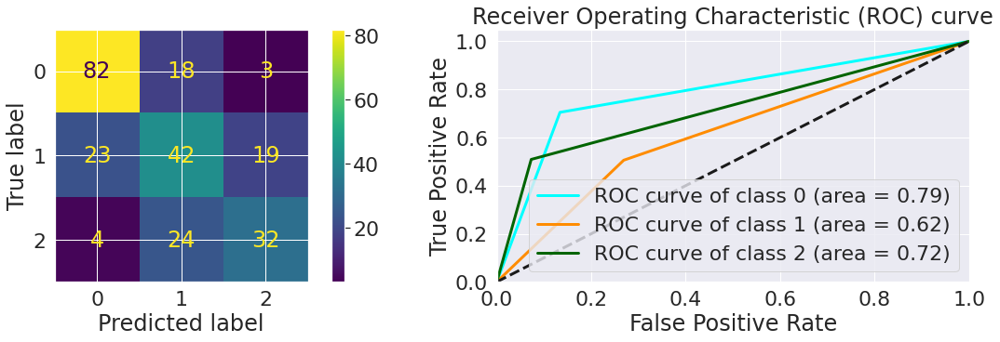

In [ ]:
## Evaluate Decision Tree with Max Depth = 5
decisiontree_model = train_DecisionTreeClassifier(X_train, y_train, 5)
model_values.append(decisiontree_model)
report_models_info("Decision Tree Classifier with Max Depth of 5", decisiontree_model, X_test, y_test, 'dt', 5, n_classes, X, y)

## Random forest Classifier


Statistics for model with Random Forest Classifier

Accuracy: 0.659919028340081

Precision: 0.6678357273039857  Recall: 0.659919028340081 

Classification Report: 
              precision    recall  f1-score   support

           0       0.77      0.79      0.78       103
           1       0.53      0.61      0.56        84
           2       0.69      0.52      0.59        60

    accuracy                           0.66       247
   macro avg       0.66      0.64      0.64       247
weighted avg       0.67      0.66      0.66       247

Confusion matrix :                                      ROC Curve :


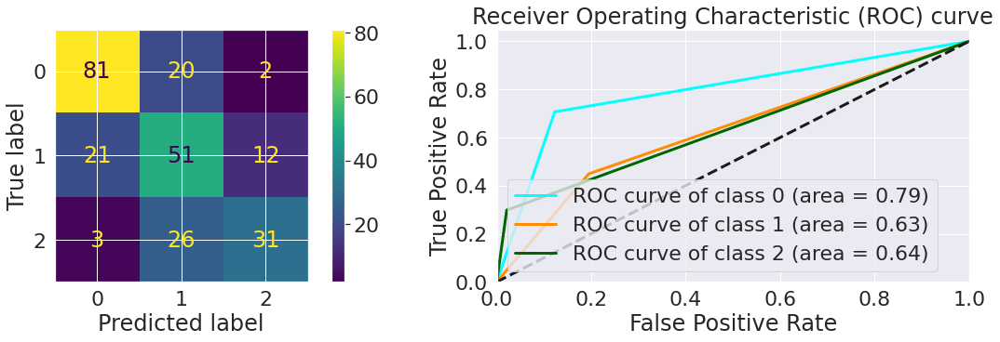

In [ ]:
## Evaluate Random Forest classifier
random_forest = train_RandomForestClassifier(X_train,y_train)
model_values.append(random_forest)
report_models_info("Random Forest Classifier", random_forest, X_test, y_test, 'rf', None, n_classes, X, y)

## Model Comparison

Linear SVM 0.6558704453441295
Poly SVM 0.8299595141700404
RBF SVM 0.8259109311740891
DecisionTreeClassifier 0.5465587044534413
DecisionTreeClassifier Max Depth 2 0.5870445344129555
DecisionTreeClassifier Max Depth 5 0.631578947368421
RandomForestClassifier 0.659919028340081


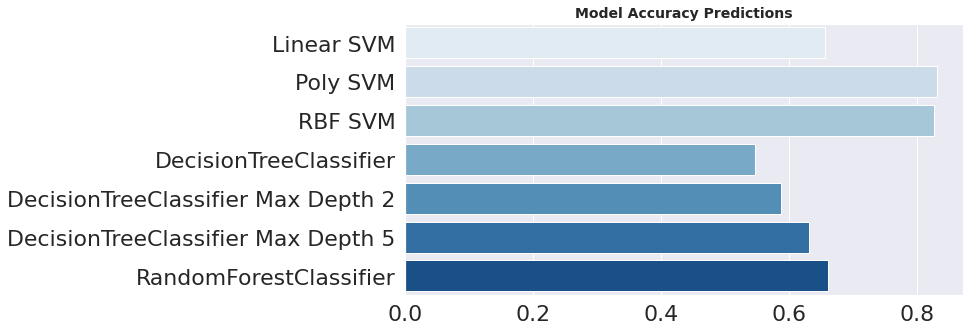

In [ ]:
model_prediction_accuracies(model_values, X_train, y_train, X_test, y_test)

## Discovering top 12 features to be used by our models

In [ ]:
"""
Using features with more importance to train model and see difference. using top 12 features:
"""
# print(featureScores.nlargest(12,'Score'))
imp_features = []
imp_features = featureScores_mental_health_consequence.nlargest(12,"Score")
# imp_features.drop(16)


In [ ]:
X_imp = df.loc[:, imp_features.Specs].to_numpy()
X_train_imp, X_test_imp, y_train, y_test = train_test_split(X_imp, y, test_size=0.2,  random_state=1)
model_values_imp = []

##SVM using 12 imp features


Statistics for model with SVM linear kernel Improved

Accuracy: 0.6477732793522267

Precision: 0.6717181353297506  Recall: 0.6477732793522267 

Classification Report: 
              precision    recall  f1-score   support

           0       0.73      0.77      0.75       103
           1       0.54      0.70      0.61        84
           2       0.76      0.37      0.49        60

    accuracy                           0.65       247
   macro avg       0.68      0.61      0.62       247
weighted avg       0.67      0.65      0.64       247

Confusion matrix :                                      ROC Curve :


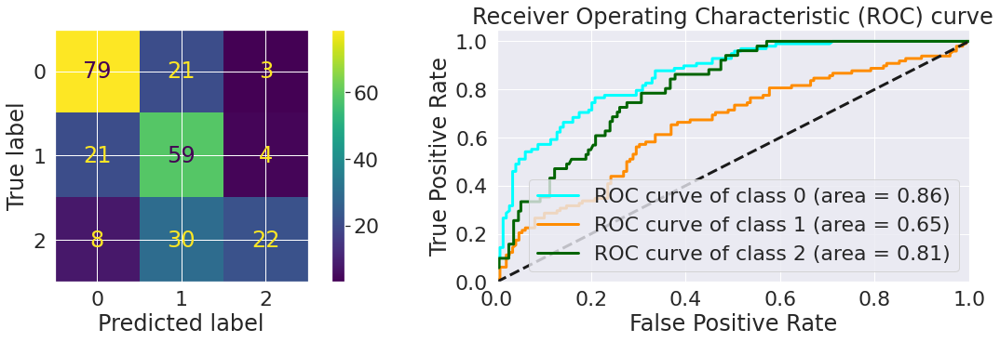

In [ ]:
## Evaluate Linear SVM
linear_model = train_svm(X_train_imp, y_train, 'linear')
model_values_imp.append(linear_model)
report_models_info("SVM linear kernel Improved", linear_model, X_test_imp, y_test, 'svm', 'linear', n_classes, X_imp, y)


Statistics for model with SVM polynomial kernel Improved

Accuracy: 0.6477732793522267

Precision: 0.6694721856025926  Recall: 0.6477732793522267 

Classification Report: 
              precision    recall  f1-score   support

           0       0.82      0.76      0.79       103
           1       0.51      0.71      0.60        84
           2       0.63      0.37      0.46        60

    accuracy                           0.65       247
   macro avg       0.65      0.61      0.62       247
weighted avg       0.67      0.65      0.64       247

Confusion matrix :                                      ROC Curve :


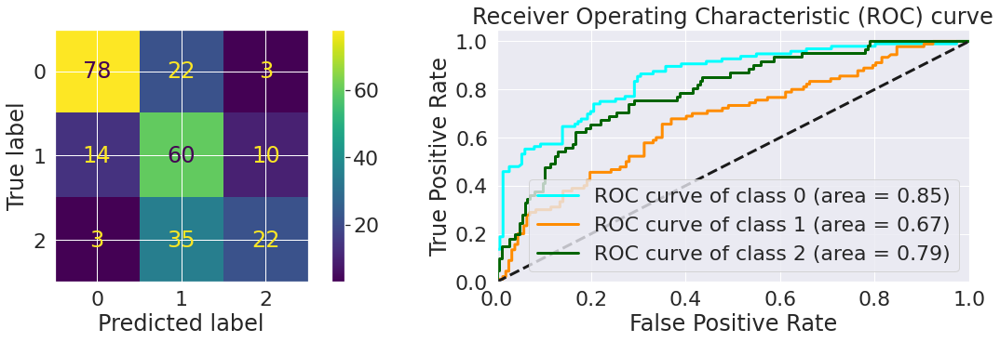

In [ ]:
## Evaluate Polynomial SVM
poly_model = train_svm(X_train_imp, y_train, 'poly')
model_values_imp.append(poly_model)
report_models_info("SVM polynomial kernel Improved", poly_model, X_test_imp, y_test, 'svm', 'poly', n_classes, X_imp, y)


Statistics for model with SVM RBF kernel Improved

Accuracy: 0.7044534412955465

Precision: 0.7184501872942601  Recall: 0.7044534412955465 

Classification Report: 
              precision    recall  f1-score   support

           0       0.78      0.81      0.79       103
           1       0.59      0.70      0.64        84
           2       0.80      0.53      0.64        60

    accuracy                           0.70       247
   macro avg       0.72      0.68      0.69       247
weighted avg       0.72      0.70      0.70       247

Confusion matrix :                                      ROC Curve :


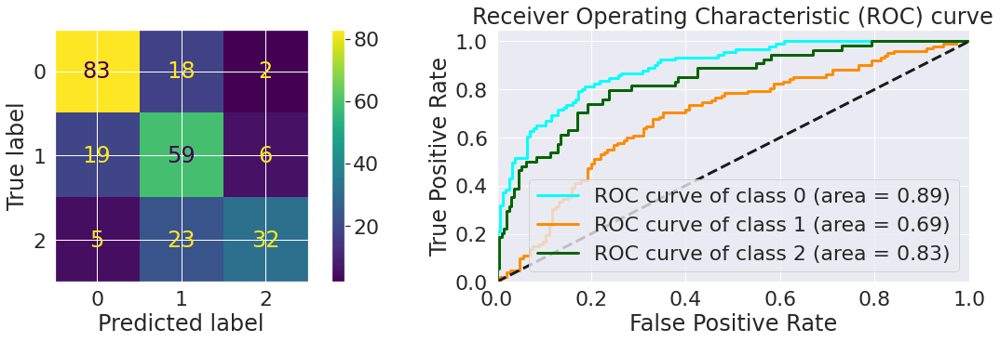

In [ ]:
## Evaluate Radial Basis Function SVM
rbf_model = train_svm(X_train_imp, y_train, 'rbf')
model_values_imp.append(rbf_model)
report_models_info("SVM RBF kernel Improved", rbf_model, X_test_imp, y_test, 'svm', 'rbf', n_classes, X_imp, y)

## Decision Tree using 12 imp features


Statistics for model with Decision Tree Classifier Improved

Accuracy: 0.5789473684210527

Precision: 0.5720966754312944  Recall: 0.5789473684210527 

Classification Report: 
              precision    recall  f1-score   support

           0       0.69      0.75      0.72       103
           1       0.46      0.43      0.44        84
           2       0.53      0.50      0.51        60

    accuracy                           0.58       247
   macro avg       0.56      0.56      0.56       247
weighted avg       0.57      0.58      0.57       247

Confusion matrix :                                      ROC Curve :


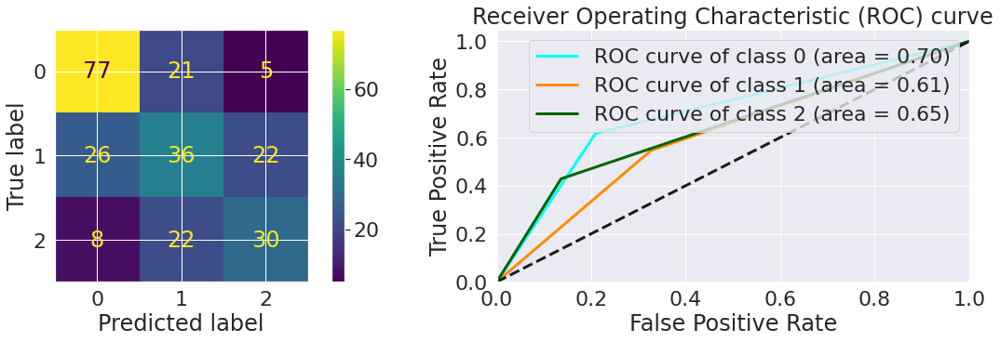

In [ ]:
## Evaluate Decision Tree
decisiontree_model_imp = train_DecisionTreeClassifier(X_train_imp, y_train, None)
model_values_imp.append(decisiontree_model_imp)
report_models_info("Decision Tree Classifier Improved", decisiontree_model_imp, X_test_imp, y_test, 'dt', None, n_classes, X_imp, y)


Statistics for model with Decision Tree Classifier Improved with Max Depth of 2

Accuracy: 0.5870445344129555

Precision: 0.6020599273505612  Recall: 0.5870445344129555 

Classification Report: 
              precision    recall  f1-score   support

           0       0.78      0.71      0.74       103
           1       0.42      0.49      0.45        84
           2       0.55      0.52      0.53        60

    accuracy                           0.59       247
   macro avg       0.58      0.57      0.58       247
weighted avg       0.60      0.59      0.59       247

Confusion matrix :                                      ROC Curve :


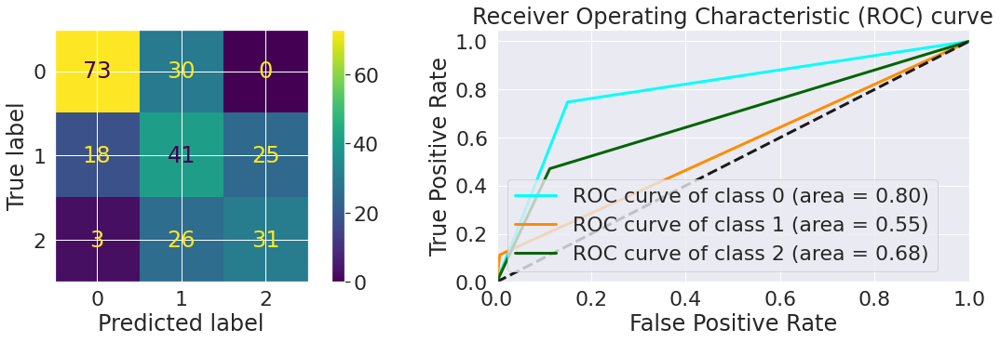

In [ ]:
## Evaluate Decision Tree with Max Depth = 2
decisiontree_model_imp = train_DecisionTreeClassifier(X_train_imp, y_train, 2)
model_values_imp.append(decisiontree_model_imp)
report_models_info("Decision Tree Classifier Improved with Max Depth of 2", decisiontree_model_imp, X_test_imp, y_test, 'dt', 2, n_classes, X_imp, y)


Statistics for model with Decision Tree Classifier Improved with Max Depth of 5

Accuracy: 0.6720647773279352

Precision: 0.6767560950795263  Recall: 0.6720647773279352 

Classification Report: 
              precision    recall  f1-score   support

           0       0.77      0.82      0.79       103
           1       0.53      0.58      0.56        84
           2       0.72      0.55      0.62        60

    accuracy                           0.67       247
   macro avg       0.67      0.65      0.66       247
weighted avg       0.68      0.67      0.67       247

Confusion matrix :                                      ROC Curve :


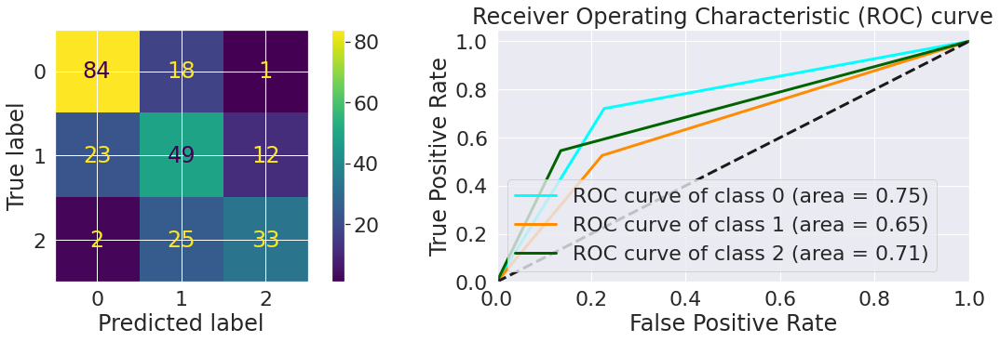

In [ ]:
## Evaluate Decision Tree with Max Depth = 5
decisiontree_model_imp = train_DecisionTreeClassifier(X_train_imp, y_train, 5)
model_values_imp.append(decisiontree_model_imp)
report_models_info("Decision Tree Classifier Improved with Max Depth of 5", decisiontree_model_imp, X_test_imp, y_test, 'dt', 5, n_classes, X_imp, y)

## Random Forest Using top 12 features


Statistics for model with Random Forest Classifier Improved

Accuracy: 0.6639676113360324

Precision: 0.6678091897592261  Recall: 0.6639676113360324 

Classification Report: 
              precision    recall  f1-score   support

           0       0.76      0.78      0.77       103
           1       0.55      0.61      0.58        84
           2       0.67      0.55      0.61        60

    accuracy                           0.66       247
   macro avg       0.66      0.64      0.65       247
weighted avg       0.67      0.66      0.66       247

Confusion matrix :                                      ROC Curve :


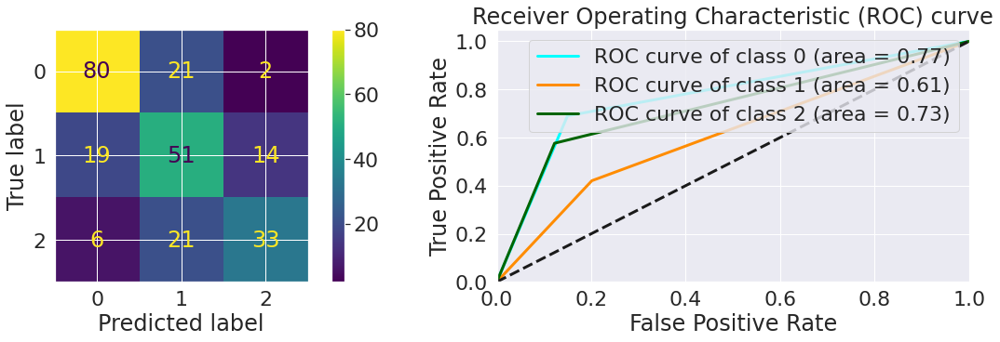

In [ ]:
random_forest_imp = train_RandomForestClassifier(X_train_imp,y_train)
model_values_imp.append(random_forest_imp)
report_models_info("Random Forest Classifier Improved", random_forest_imp, X_test_imp, y_test, 'rf', None, n_classes, X_imp, y)

In [ ]:
predict = random_forest_imp.predict(X_test_imp)
accuracy = accuracy_score(y_test, predict)
accuracy

0.6639676113360324

## Compare model accuracies

Linear SVM 0.6477732793522267
Poly SVM 0.6477732793522267
RBF SVM 0.7044534412955465
DecisionTreeClassifier 0.5789473684210527
DecisionTreeClassifier Max Depth 2 0.5870445344129555
DecisionTreeClassifier Max Depth 5 0.6720647773279352
RandomForestClassifier 0.6639676113360324


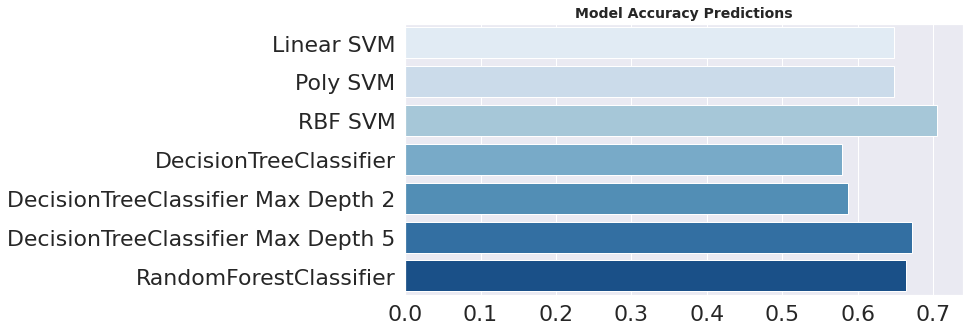

In [ ]:
model_prediction_accuracies(model_values_imp, X_train_imp, y_train, X_test_imp, y_test)

#Part 4: Model Builting and Testing for Question 3:

##**Do qualities relating to mental health indicate a likelihood of being in the tech industry?**

In [ ]:
from sklearn.model_selection import train_test_split
y = df['tech_company'].to_numpy()
X = df.loc[:, df.columns != 'tech_company'].to_numpy()
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2,  random_state=1)
model_values = []
n_classes = df['tech_company'].unique().size

## SVM


Statistics for model with SVM linear kernel

Accuracy: 0.8299595141700404

Precision: 0.6888327951613695  Recall: 0.8299595141700404 

Classification Report: 
              precision    recall  f1-score   support

           0       0.83      1.00      0.91       205
           1       0.00      0.00      0.00        42

    accuracy                           0.83       247
   macro avg       0.41      0.50      0.45       247
weighted avg       0.69      0.83      0.75       247

Confusion matrix :                                      ROC Curve :


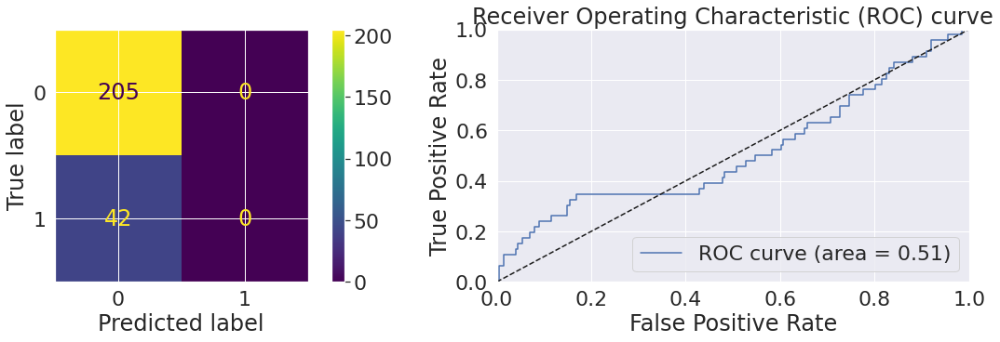

In [ ]:
linear_model = train_svm(X_train, y_train, 'linear')
model_values.append(linear_model)
report_models_info("SVM linear kernel", linear_model, X_test, y_test, 'svm', 'linear', n_classes, X, y)


Statistics for model with SVM poly kernel

Accuracy: 0.8340080971659919

Precision: 0.7982299996654063  Recall: 0.8340080971659919 

Classification Report: 
              precision    recall  f1-score   support

           0       0.84      0.99      0.91       205
           1       0.60      0.07      0.13        42

    accuracy                           0.83       247
   macro avg       0.72      0.53      0.52       247
weighted avg       0.80      0.83      0.78       247

Confusion matrix :                                      ROC Curve :


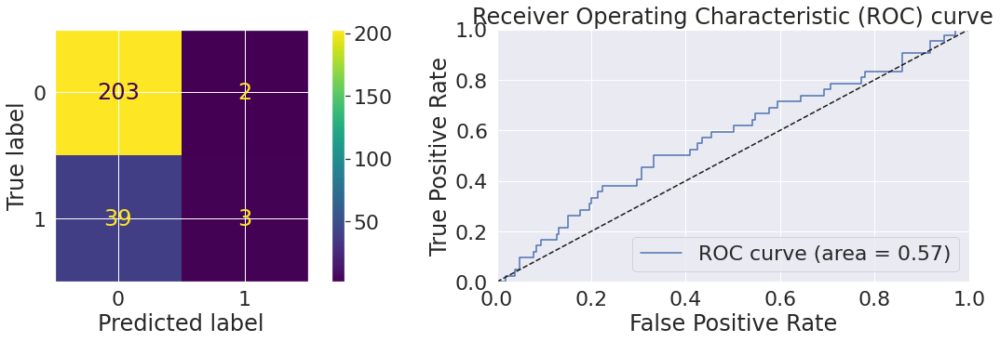

In [ ]:
poly_model = train_svm(X_train, y_train, 'poly')
model_values.append(poly_model)
report_models_info("SVM poly kernel", poly_model, X_test, y_test, 'svm', 'poly', n_classes, X, y)


Statistics for model with SVM RBF kernel

Accuracy: 0.8299595141700404

Precision: 0.6888327951613695  Recall: 0.8299595141700404 

Classification Report: 
              precision    recall  f1-score   support

           0       0.83      1.00      0.91       205
           1       0.00      0.00      0.00        42

    accuracy                           0.83       247
   macro avg       0.41      0.50      0.45       247
weighted avg       0.69      0.83      0.75       247

Confusion matrix :                                      ROC Curve :


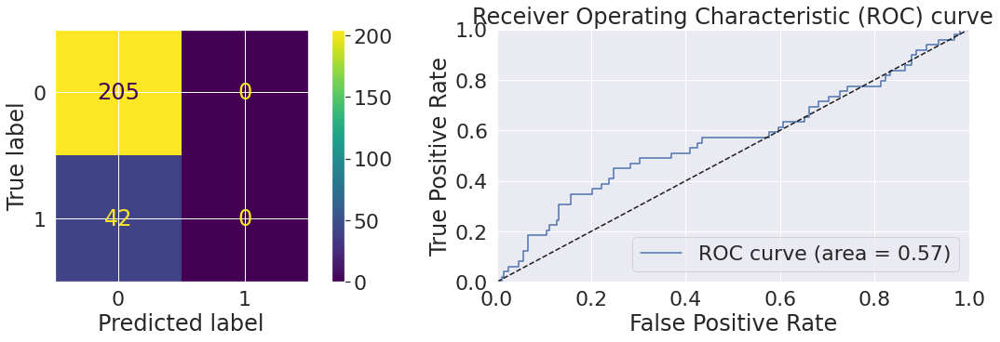

In [ ]:
## Evaluate Radial Basis Function SVM Improved
rbf_model = train_svm(X_train, y_train, 'rbf')
model_values.append(rbf_model)
report_models_info("SVM RBF kernel", rbf_model, X_test, y_test, 'svm', 'rbf', n_classes, X, y)

## Decision Tree


Statistics for model with Decision Tree Classifier

Accuracy: 0.7246963562753036

Precision: 0.7347919791992334  Recall: 0.7246963562753036 

Classification Report: 
              precision    recall  f1-score   support

           0       0.84      0.82      0.83       205
           1       0.22      0.24      0.23        42

    accuracy                           0.72       247
   macro avg       0.53      0.53      0.53       247
weighted avg       0.73      0.72      0.73       247

Confusion matrix :                                      ROC Curve :


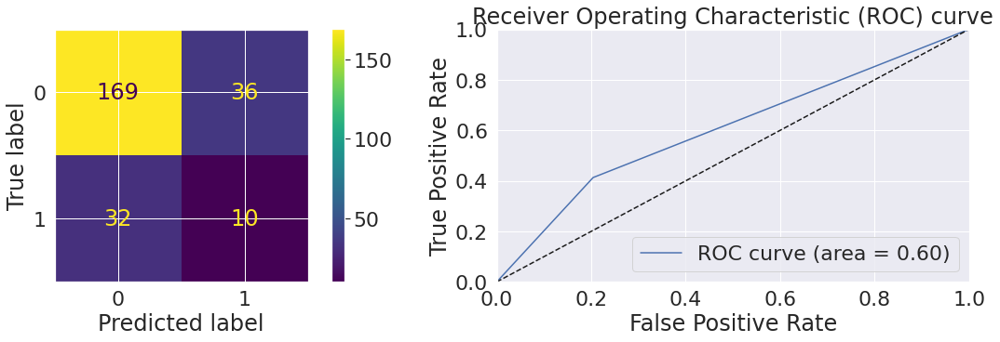

In [ ]:
## Evaluate Decision Tree
decisiontree_model = train_DecisionTreeClassifier(X_train, y_train, None)
model_values.append(decisiontree_model)
report_models_info("Decision Tree Classifier", decisiontree_model, X_test, y_test, 'dt', None, n_classes, X, y)


Statistics for model with Decision Tree Classifier with Max Depth of 2

Accuracy: 0.8097165991902834

Precision: 0.7474999134918163  Recall: 0.8097165991902834 

Classification Report: 
              precision    recall  f1-score   support

           0       0.84      0.96      0.89       205
           1       0.31      0.10      0.15        42

    accuracy                           0.81       247
   macro avg       0.57      0.53      0.52       247
weighted avg       0.75      0.81      0.77       247

Confusion matrix :                                      ROC Curve :


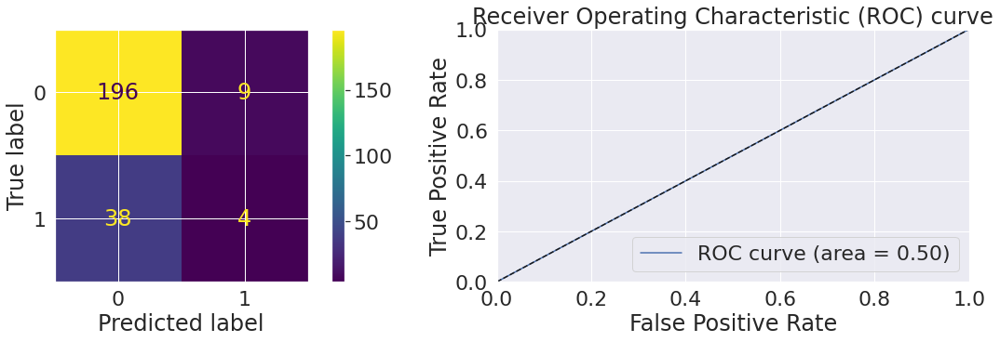

In [ ]:
## Evaluate Decision Tree with Max Depth = 2
decisiontree_model = train_DecisionTreeClassifier(X_train, y_train, 2)
model_values.append(decisiontree_model)
report_models_info("Decision Tree Classifier with Max Depth of 2", decisiontree_model, X_test, y_test, 'dt', 2, n_classes, X, y)


Statistics for model with Decision Tree Classifier with Max Depth of 5

Accuracy: 0.7935222672064778

Precision: 0.7520297922900898  Recall: 0.7935222672064778 

Classification Report: 
              precision    recall  f1-score   support

           0       0.84      0.92      0.88       205
           1       0.30      0.17      0.22        42

    accuracy                           0.79       247
   macro avg       0.57      0.54      0.55       247
weighted avg       0.75      0.79      0.77       247

Confusion matrix :                                      ROC Curve :


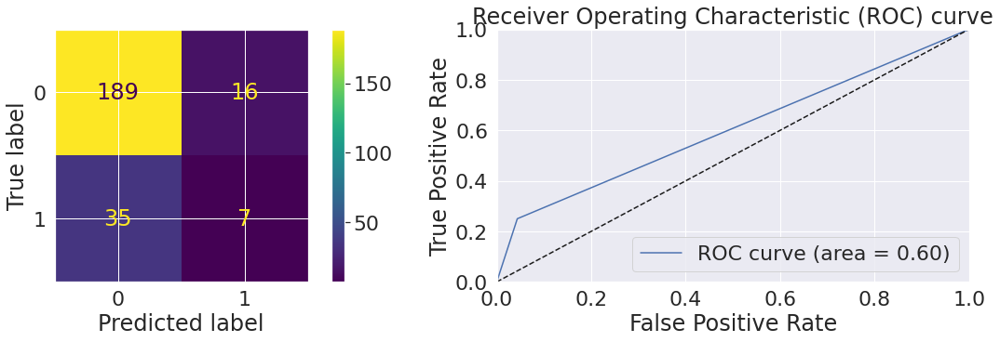

In [ ]:
## Evaluate Decision Tree with Max Depth = 5
decisiontree_model = train_DecisionTreeClassifier(X_train, y_train, 5)
model_values.append(decisiontree_model)
report_models_info("Decision Tree Classifier with Max Depth of 5", decisiontree_model, X_test, y_test, 'dt', 5, n_classes, X, y)

## Random Forest Classifier


Statistics for model with Random Forest Classifier

Accuracy: 0.8380566801619433

Precision: 0.8124548524199103  Recall: 0.8380566801619433 

Classification Report: 
              precision    recall  f1-score   support

           0       0.84      0.99      0.91       205
           1       0.67      0.10      0.17        42

    accuracy                           0.84       247
   macro avg       0.75      0.54      0.54       247
weighted avg       0.81      0.84      0.78       247

Confusion matrix :                                      ROC Curve :


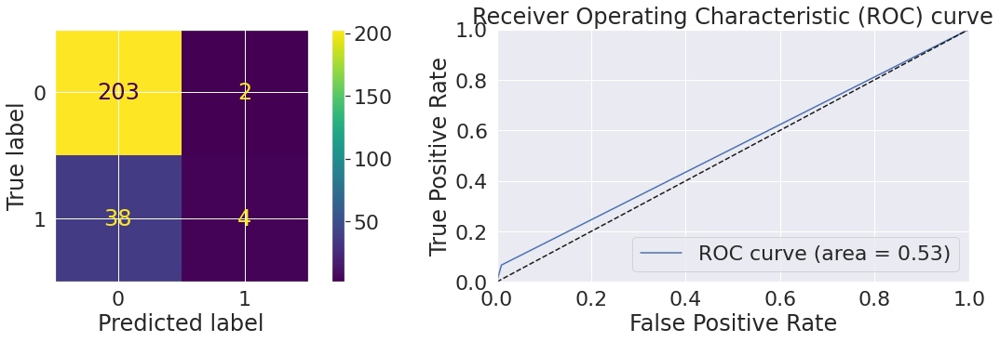

In [ ]:
random_forest = train_RandomForestClassifier(X_train,y_train)
model_values.append(random_forest)
report_models_info("Random Forest Classifier", random_forest, X_test, y_test, 'rf', None, n_classes, X, y)

Linear SVM 0.8299595141700404
Poly SVM 0.8340080971659919
RBF SVM 0.8299595141700404
DecisionTreeClassifier 0.7246963562753036
DecisionTreeClassifier Max Depth 2 0.8097165991902834
DecisionTreeClassifier Max Depth 5 0.7935222672064778
RandomForestClassifier 0.8380566801619433


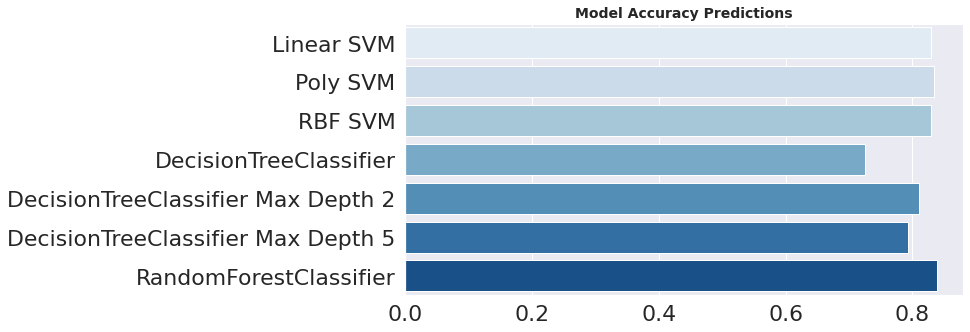

In [ ]:
model_prediction_accuracies(model_values, X_train, y_train, X_test, y_test)

## Discovering top 12 features to be used by our models

In [ ]:
imp_features = []
imp_features = featureScores_tech_industry.nlargest(12,"Score")
imp_features

,Specs,Score
2,Country,76.778030
12,wellness_program,20.487229
9,remote_work,15.496826
16,mental_health_consequence,11.898478
20,mental_health_interview,11.788721
22,mental_vs_physical,9.882439
13,seek_help,9.531346
17,phys_health_consequence,9.386044
3,state,9.088113
0,Age,7.914118


In [ ]:
X_imp = df.loc[:, imp_features.Specs].to_numpy()
X_train_imp, X_test_imp, y_train, y_test = train_test_split(X_imp, y, test_size=0.2)
model_values_imp = []

## SVM for top 12


Statistics for model with SVM RBF kernel

Accuracy: 0.8137651821862348

Precision: 0.662213771738596  Recall: 0.8137651821862348 

Classification Report: 
              precision    recall  f1-score   support

           0       0.81      1.00      0.90       201
           1       0.00      0.00      0.00        46

    accuracy                           0.81       247
   macro avg       0.41      0.50      0.45       247
weighted avg       0.66      0.81      0.73       247

Confusion matrix :                                      ROC Curve :


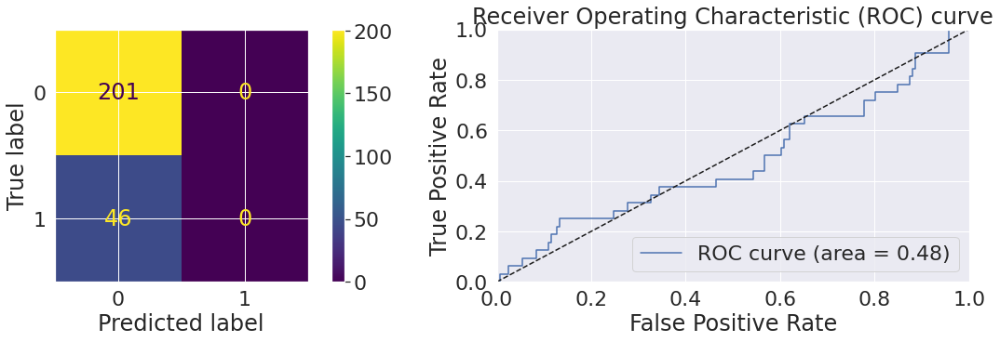

In [ ]:
linear_model = train_svm(X_train_imp, y_train, 'linear')
model_values_imp.append(linear_model)
report_models_info("SVM RBF kernel", linear_model, X_test_imp, y_test, 'svm', 'linear', n_classes, X_train_imp, y_train)


Statistics for model with SVM poly kernel

Accuracy: 0.8178137651821862

Precision: 0.7770425309125  Recall: 0.8178137651821862 

Classification Report: 
              precision    recall  f1-score   support

           0       0.83      0.98      0.90       201
           1       0.56      0.11      0.18        46

    accuracy                           0.82       247
   macro avg       0.69      0.54      0.54       247
weighted avg       0.78      0.82      0.76       247

Confusion matrix :                                      ROC Curve :


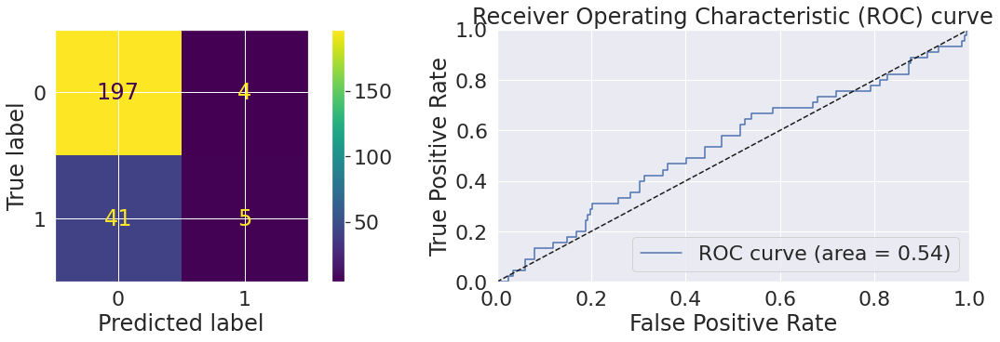

In [ ]:
poly_model = train_svm(X_train_imp, y_train, 'poly')
model_values_imp.append(poly_model)
report_models_info("SVM poly kernel", poly_model, X_test_imp, y_test, 'svm', 'poly', n_classes, X_imp, y)


Statistics for model with SVM RBF kernel

Accuracy: 0.8137651821862348

Precision: 0.662213771738596  Recall: 0.8137651821862348 

Classification Report: 
              precision    recall  f1-score   support

           0       0.81      1.00      0.90       201
           1       0.00      0.00      0.00        46

    accuracy                           0.81       247
   macro avg       0.41      0.50      0.45       247
weighted avg       0.66      0.81      0.73       247

Confusion matrix :                                      ROC Curve :


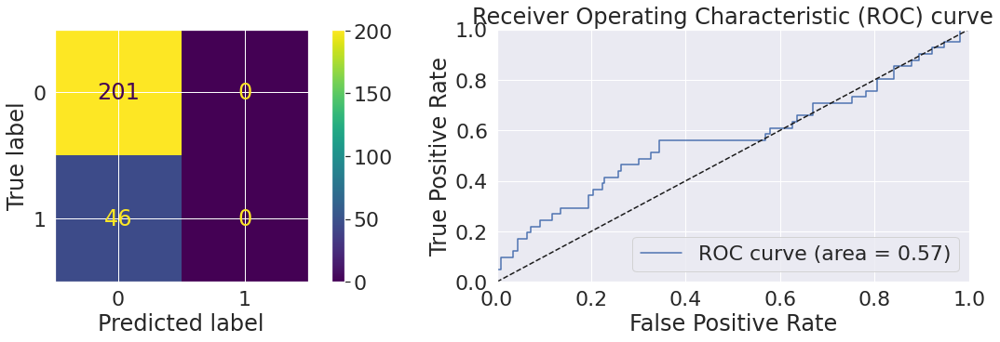

In [ ]:
rbf_model = train_svm(X_train_imp, y_train, 'rbf')
model_values_imp.append(rbf_model)
report_models_info("SVM RBF kernel", rbf_model, X_test_imp, y_test, 'svm', 'rbf', n_classes, X_imp, y)

## Decision Tree for top 12


Statistics for model with Decision Tree Classifier Improved

Accuracy: 0.757085020242915

Precision: 0.757085020242915  Recall: 0.757085020242915 

Classification Report: 
              precision    recall  f1-score   support

           0       0.85      0.85      0.85       201
           1       0.35      0.35      0.35        46

    accuracy                           0.76       247
   macro avg       0.60      0.60      0.60       247
weighted avg       0.76      0.76      0.76       247

Confusion matrix :                                      ROC Curve :


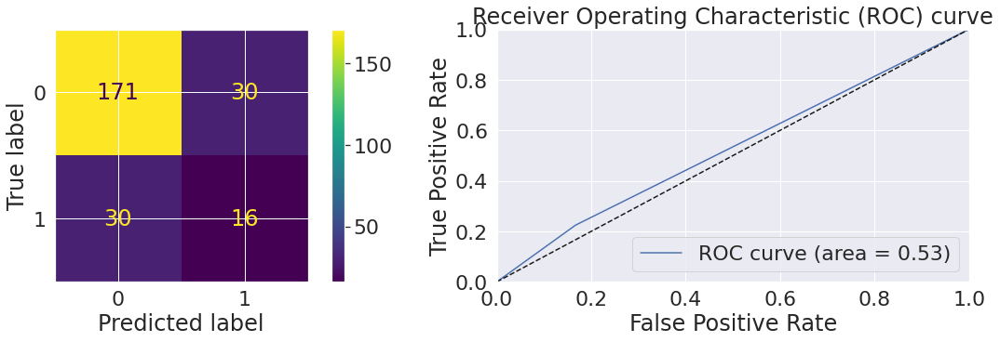

In [ ]:
## Evaluate Decision Tree
decisiontree_model_imp = train_DecisionTreeClassifier(X_train_imp, y_train, None)
model_values_imp.append(decisiontree_model_imp)
report_models_info("Decision Tree Classifier Improved", decisiontree_model_imp, X_test_imp, y_test, 'dt', None, n_classes, X_imp, y)


Statistics for model with Decision Tree Classifier Improved with Max Depth of 2

Accuracy: 0.8137651821862348

Precision: 0.662213771738596  Recall: 0.8137651821862348 

Classification Report: 
              precision    recall  f1-score   support

           0       0.81      1.00      0.90       201
           1       0.00      0.00      0.00        46

    accuracy                           0.81       247
   macro avg       0.41      0.50      0.45       247
weighted avg       0.66      0.81      0.73       247

Confusion matrix :                                      ROC Curve :


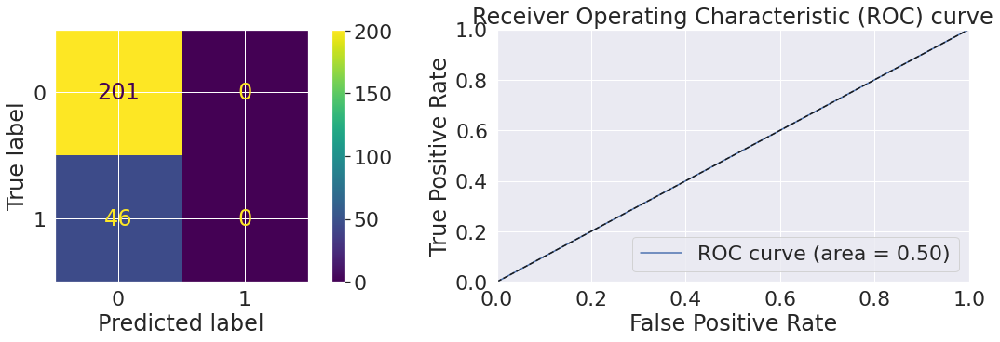

In [ ]:
## Evaluate Decision Tree with Max Depth = 2
decisiontree_model_imp = train_DecisionTreeClassifier(X_train_imp, y_train, 2)
model_values_imp.append(decisiontree_model_imp)
report_models_info("Decision Tree Classifier Improved with Max Depth of 2", decisiontree_model_imp, X_test_imp, y_test, 'dt', 2, n_classes, X_imp, y)


Statistics for model with Decision Tree Classifier Improved with Max Depth of 5

Accuracy: 0.8218623481781376

Precision: 0.7873517673069745  Recall: 0.8218623481781376 

Classification Report: 
              precision    recall  f1-score   support

           0       0.83      0.98      0.90       201
           1       0.58      0.15      0.24        46

    accuracy                           0.82       247
   macro avg       0.71      0.56      0.57       247
weighted avg       0.79      0.82      0.78       247

Confusion matrix :                                      ROC Curve :


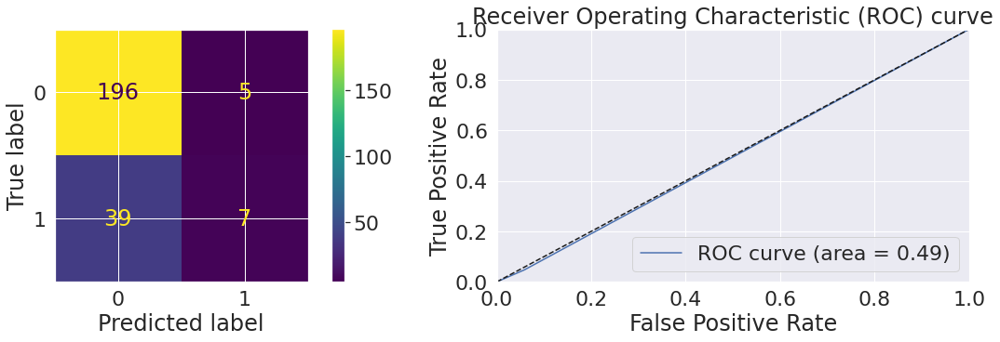

In [ ]:
## Evaluate Decision Tree with Max Depth = 5
decisiontree_model_imp = train_DecisionTreeClassifier(X_train_imp, y_train, 5)
model_values_imp.append(decisiontree_model_imp)
report_models_info("Decision Tree Classifier Improved with Max Depth of 5", decisiontree_model_imp, X_test_imp, y_test, 'dt', 5, n_classes, X_imp, y)

## Random Forest Classifier using top 12 important features


Statistics for model with Random Forest Classifier Improved

Accuracy: 0.8259109311740891

Precision: 0.8011544698851201  Recall: 0.8259109311740891 

Classification Report: 
              precision    recall  f1-score   support

           0       0.83      0.99      0.90       201
           1       0.67      0.13      0.22        46

    accuracy                           0.83       247
   macro avg       0.75      0.56      0.56       247
weighted avg       0.80      0.83      0.77       247

Confusion matrix :                                      ROC Curve :


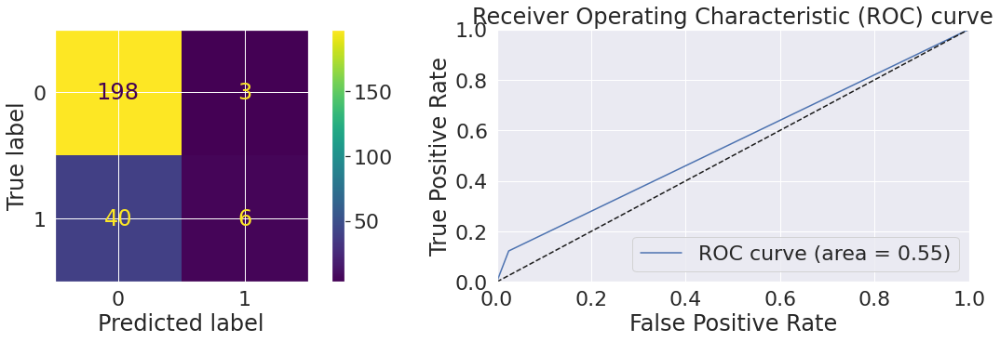

In [ ]:
random_forest_imp = train_RandomForestClassifier(X_train_imp,y_train)
model_values_imp.append(random_forest_imp)
report_models_info("Random Forest Classifier Improved", random_forest_imp, X_test_imp, y_test, 'rf', None, n_classes, X_imp, y)

## Compare model accuracies

Linear SVM 0.8137651821862348
Poly SVM 0.8178137651821862
RBF SVM 0.8137651821862348
DecisionTreeClassifier 0.757085020242915
DecisionTreeClassifier Max Depth 2 0.8137651821862348
DecisionTreeClassifier Max Depth 5 0.8218623481781376
RandomForestClassifier 0.8259109311740891


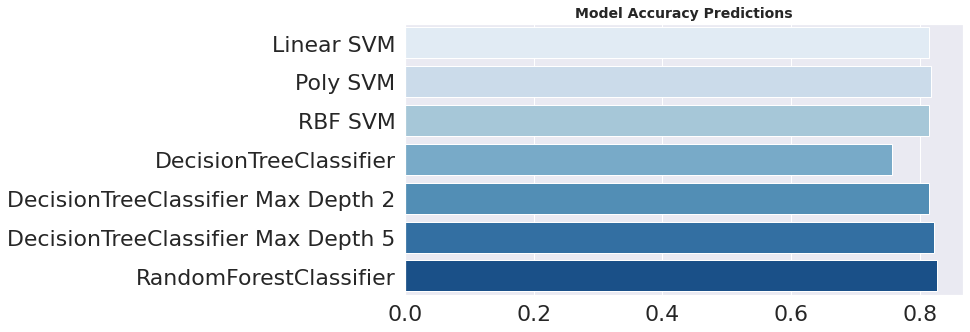

In [ ]:
model_prediction_accuracies(model_values_imp, X_train_imp, y_train, X_test_imp, y_test)

Controlling for target class distribution

In [ ]:

df_no = df.loc[df['tech_company'] == 0]
df_yes = df.loc[df['tech_company'] == 1]
df_no = df_no.head(len(df_yes.index))

frames = [df_no, df_yes]
df = pd.concat(frames)

y = df['tech_company'].to_numpy()
X = df.loc[:, df.columns != 'tech_company'].to_numpy()
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2)
n_classes = df['tech_company'].unique().size

X_imp = df.loc[:, imp_features.Specs].to_numpy()
X_train_imp, X_test_imp, y_train, y_test = train_test_split(X_imp, y, test_size=0.2)
model_values_imp = []


Statistics for model with SVM linear kernel

Accuracy: 0.6666666666666666

Precision: 0.6726190476190476  Recall: 0.6666666666666666 

Classification Report: 
              precision    recall  f1-score   support

           0       0.73      0.67      0.70        52
           1       0.60      0.66      0.62        38

    accuracy                           0.67        90
   macro avg       0.66      0.67      0.66        90
weighted avg       0.67      0.67      0.67        90

Confusion matrix :                                      ROC Curve :


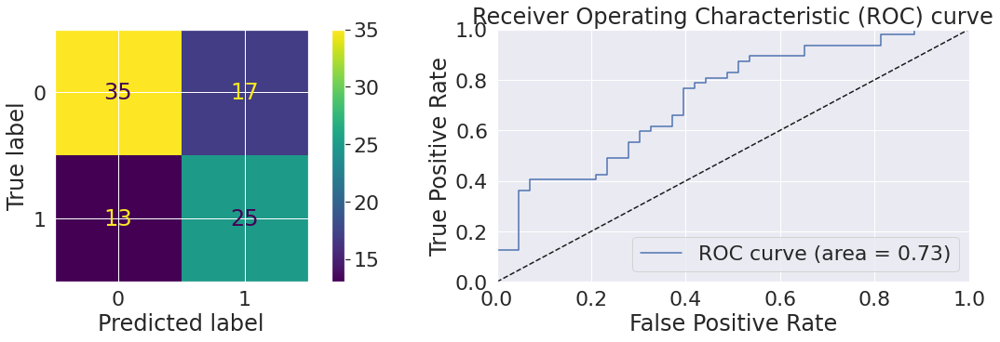

In [ ]:
linear_model = train_svm(X_train_imp, y_train, 'linear')
model_values_imp.append(linear_model)
report_models_info("SVM linear kernel", linear_model, X_test_imp, y_test, 'svm', 'linear', n_classes, X_imp, y)


Statistics for model with SVM poly kernel

Accuracy: 0.6444444444444445

Precision: 0.6421810699588478  Recall: 0.6444444444444445 

Classification Report: 
              precision    recall  f1-score   support

           0       0.69      0.71      0.70        52
           1       0.58      0.55      0.57        38

    accuracy                           0.64        90
   macro avg       0.63      0.63      0.63        90
weighted avg       0.64      0.64      0.64        90

Confusion matrix :                                      ROC Curve :


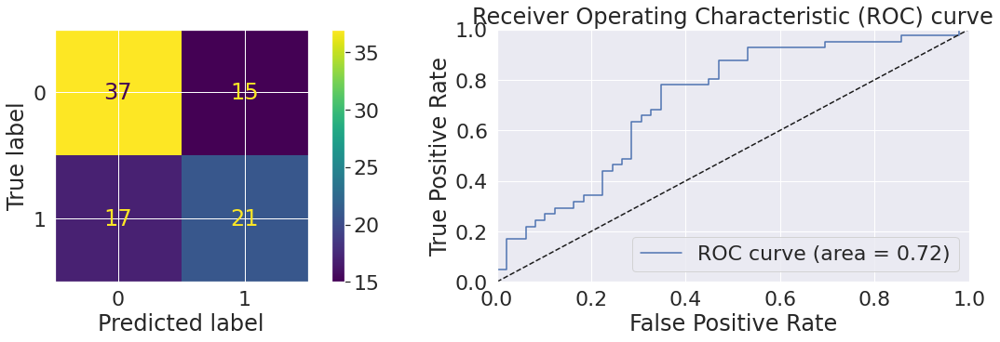

In [ ]:
poly_model = train_svm(X_train_imp, y_train, 'poly')
model_values_imp.append(poly_model)
report_models_info("SVM poly kernel", poly_model, X_test_imp, y_test, 'svm', 'poly', n_classes, X_imp, y)


Statistics for model with SVM RBF kernel

Accuracy: 0.6666666666666666

Precision: 0.6726190476190476  Recall: 0.6666666666666666 

Classification Report: 
              precision    recall  f1-score   support

           0       0.73      0.67      0.70        52
           1       0.60      0.66      0.62        38

    accuracy                           0.67        90
   macro avg       0.66      0.67      0.66        90
weighted avg       0.67      0.67      0.67        90

Confusion matrix :                                      ROC Curve :


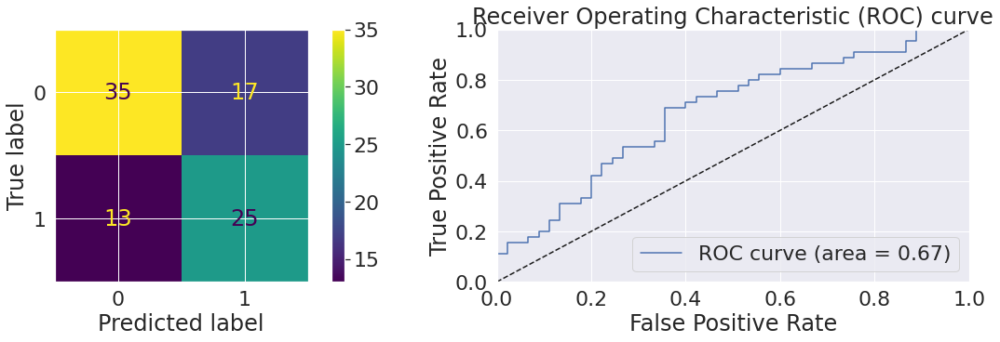

In [ ]:
rbf_model = train_svm(X_train_imp, y_train, 'rbf')
model_values_imp.append(rbf_model)
report_models_info("SVM RBF kernel", rbf_model, X_test_imp, y_test, 'svm', 'rbf', n_classes, X_imp, y)


Statistics for model with Decision Tree Classifier Improved

Accuracy: 0.5111111111111111

Precision: 0.5407407407407407  Recall: 0.5111111111111111 

Classification Report: 
              precision    recall  f1-score   support

           0       0.61      0.42      0.50        52
           1       0.44      0.63      0.52        38

    accuracy                           0.51        90
   macro avg       0.53      0.53      0.51        90
weighted avg       0.54      0.51      0.51        90

Confusion matrix :                                      ROC Curve :


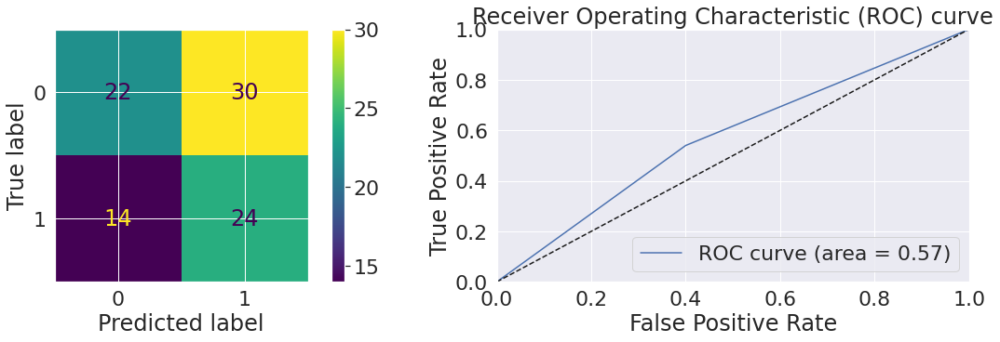

In [ ]:
decisiontree_model_imp = train_DecisionTreeClassifier(X_train_imp, y_train, None)
model_values_imp.append(decisiontree_model_imp)
report_models_info("Decision Tree Classifier Improved", decisiontree_model_imp, X_test_imp, y_test, 'dt', None, n_classes, X_imp, y)


Statistics for model with Decision Tree Classifier Improved with Max Depth of 2

Accuracy: 0.6444444444444445

Precision: 0.7023946360153257  Recall: 0.6444444444444445 

Classification Report: 
              precision    recall  f1-score   support

           0       0.81      0.50      0.62        52
           1       0.55      0.84      0.67        38

    accuracy                           0.64        90
   macro avg       0.68      0.67      0.64        90
weighted avg       0.70      0.64      0.64        90

Confusion matrix :                                      ROC Curve :


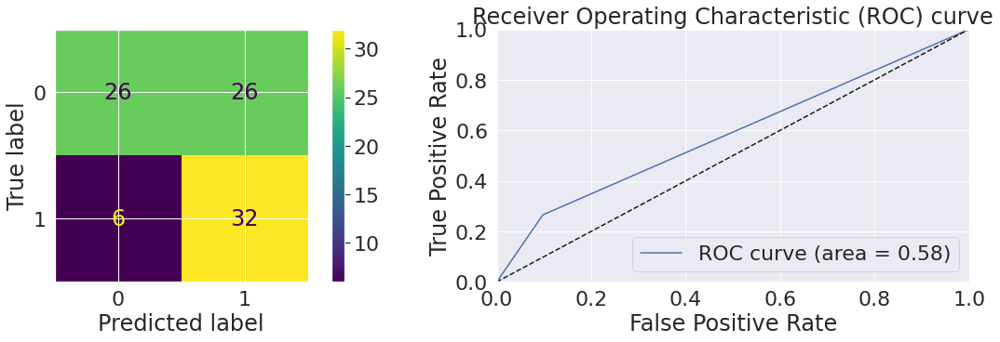

In [ ]:
## Evaluate Decision Tree with Max Depth = 2
decisiontree_model_imp = train_DecisionTreeClassifier(X_train_imp, y_train, 2)
model_values_imp.append(decisiontree_model_imp)
report_models_info("Decision Tree Classifier Improved with Max Depth of 2", decisiontree_model_imp, X_test_imp, y_test, 'dt', 2, n_classes, X_imp, y)


Statistics for model with Decision Tree Classifier Improved with Max Depth of 5

Accuracy: 0.6111111111111112

Precision: 0.6232098765432099  Recall: 0.6111111111111112 

Classification Report: 
              precision    recall  f1-score   support

           0       0.69      0.60      0.64        52
           1       0.53      0.63      0.58        38

    accuracy                           0.61        90
   macro avg       0.61      0.61      0.61        90
weighted avg       0.62      0.61      0.61        90

Confusion matrix :                                      ROC Curve :


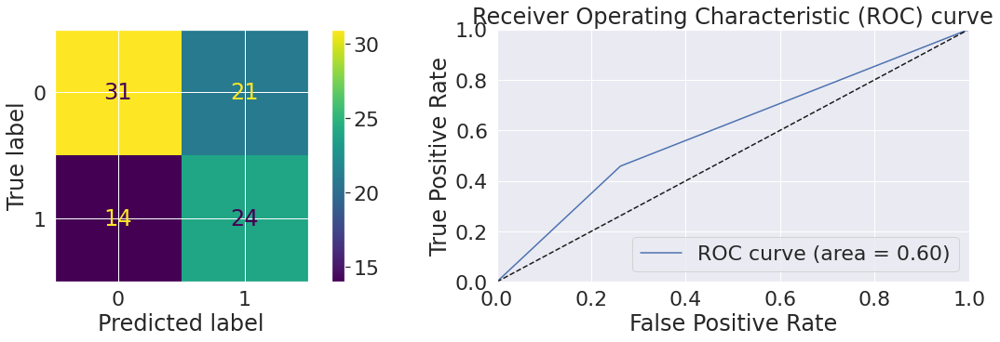

In [ ]:
decisiontree_model_imp = train_DecisionTreeClassifier(X_train_imp, y_train, 5)
model_values_imp.append(decisiontree_model_imp)
report_models_info("Decision Tree Classifier Improved with Max Depth of 5", decisiontree_model_imp, X_test_imp, y_test, 'dt', 5, n_classes, X_imp, y)


Statistics for model with Random Forest Classifier Improved

Accuracy: 0.6222222222222222

Precision: 0.6365393061045235  Recall: 0.6222222222222222 

Classification Report: 
              precision    recall  f1-score   support

           0       0.70      0.60      0.65        52
           1       0.54      0.66      0.60        38

    accuracy                           0.62        90
   macro avg       0.62      0.63      0.62        90
weighted avg       0.64      0.62      0.62        90

Confusion matrix :                                      ROC Curve :


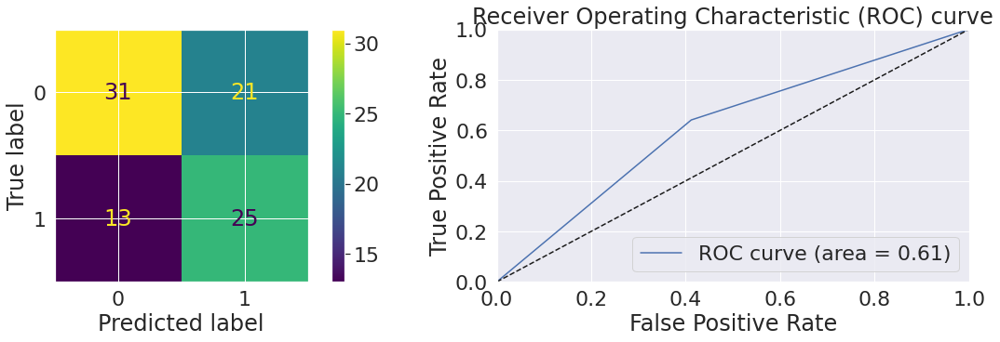

In [ ]:
random_forest_imp = train_RandomForestClassifier(X_train_imp,y_train)
model_values_imp.append(random_forest_imp)
report_models_info("Random Forest Classifier Improved", random_forest_imp, X_test_imp, y_test, 'rf', None, n_classes, X_imp, y)

Linear SVM 0.6666666666666666
Poly SVM 0.6444444444444445
RBF SVM 0.6666666666666666
DecisionTreeClassifier 0.5111111111111111
DecisionTreeClassifier Max Depth 2 0.6444444444444445
DecisionTreeClassifier Max Depth 5 0.6111111111111112
RandomForestClassifier 0.6222222222222222


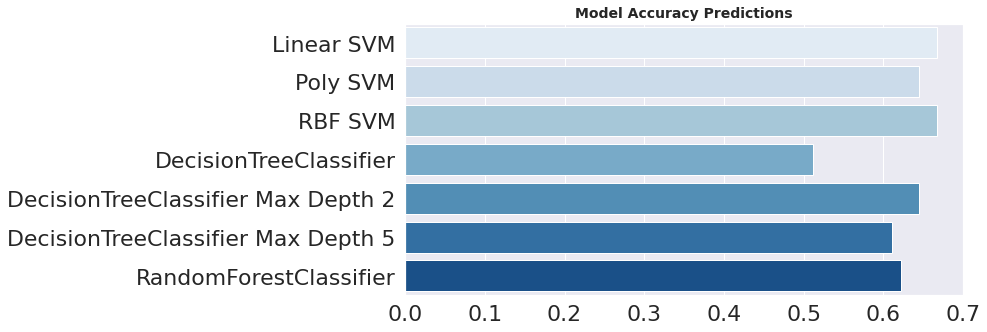

In [ ]:
model_prediction_accuracies(model_values_imp, X_train_imp, y_train, X_test_imp, y_test)